### **UAS DEEP LEARNING**
#### Putri Maysa Adira
#### 2702372826
#### LB09
#### No 3 (dataset A_23)

## LINK VIDEO : https://drive.google.com/file/d/1C0GCa7OjR60gwhuRcRETdl443gHk0beB/view?usp=sharing

In [2]:
import matplotlib.pyplot as plt
import cv2
import os
import tensorflow as tf
import keras
from scipy.linalg import sqrtm
import time
from tensorflow.keras import layers, Model, Sequential
from keras import layers
import numpy as np
from tqdm import tqdm
import re
from tensorflow.keras.utils import img_to_array
from datasets import load_dataset
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

In [4]:
def loadFile(folder_path='/kaggle/input/datasetnumb3/A_23', size=(100, 100)):
    images = []
    valid_extensions = ('.jpg', '.png', '.jpeg')

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(valid_extensions):
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            img = cv2.resize(img, size)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img.astype(np.float32) / 127.5 - 1.0
            images.append(img)

    return np.array(images)

In [9]:
real_images = loadFile('/kaggle/input/datasetnumb3/A_23', size=(100, 100))

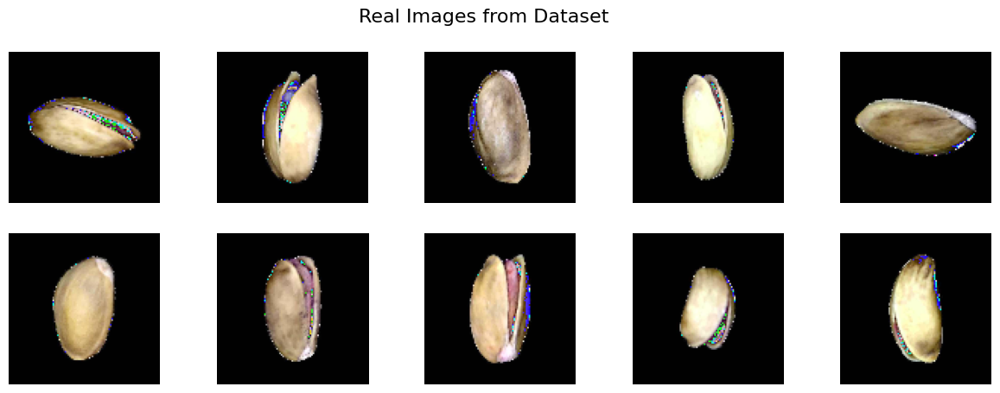

In [5]:
def plot_real_images(images, num_images=10):
    plt.figure(figsize=(15, 5))
    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow((images[i] * 255).astype(np.uint8))
        plt.axis('off')
    plt.suptitle('Real Images from Dataset', fontsize=16)
    plt.show()

plot_real_images(real_images, num_images=10)

## Generator Model

In [13]:
latent_dim=100
def Generator():
  model= tf.keras.Sequential(name="Generator")

  model.add(tf.keras.layers.Dense(30 * 30 * 64, input_shape=(latent_dim,)))
  model.add(tf.keras.layers.Activation('relu'))
  model.add(tf.keras.layers.Reshape((30, 30, 64)))

  model.add(tf.keras.layers.UpSampling2D(size=(2, 2)))
  model.add(tf.keras.layers.Conv2D(16, kernel_size=3, strides=1, padding='valid', activation='relu'))

  model.add(tf.keras.layers.UpSampling2D(size=(2, 2)))
  model.add(tf.keras.layers.Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu'))

  model.add(tf.keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='valid', activation='relu'))

  model.add(tf.keras.layers.Conv2D(3, kernel_size=3, strides=1, padding='valid', activation='tanh'))

  model.add(tf.keras.layers.Cropping2D(cropping=((5, 5), (5, 5))))

  return model

generator = Generator()
generator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 57600)               │       5,817,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 60, 60, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 58, 58, 16)          │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 116, 116, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 114, 114, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 110, 110, 3)         │           1,731 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cropping2d (Cropping2D)              │ (None, 100, 100, 3)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,851,699 (22.32 MB)

 Trainable params: 5,851,699 (22.32 MB)

 Non-trainable params: 0 (0.00 B)

## Discriminator Model

In [14]:
def Discriminator(image_shape=(100, 100, 3)):
  model= Sequential(name="Discriminator")

  model.add(layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu', input_shape= image_shape))
  
  model.add(layers.Conv2D(32, (3, 3), strides=1, padding='valid',  activation='relu'))
  
  model.add(layers.Conv2D(64, (3, 3), strides=1, padding='valid',  activation='relu'))

  model.add(layers.Flatten())
  model.add(layers.Dense(1, activation='sigmoid'))

  return model

discriminator= Discriminator()
discriminator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 98, 98, 16)          │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 96, 96, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 94, 94, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 565504)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │         565,505 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 589,089 (2.25 MB)

 Trainable params: 589,089 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

I0000 00:00:1751090301.299770      35 cuda_dnn.cc:529] Loaded cuDNN version 90300


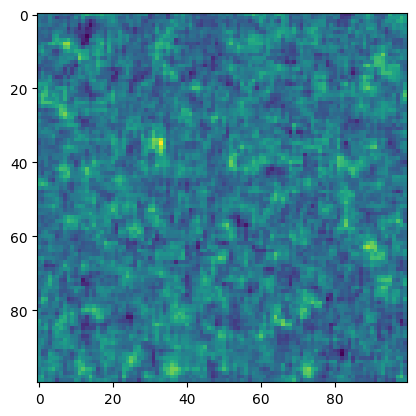

In [15]:
noise= np.random.normal(-1,1,(1,100))
img= generator(noise)
plt.imshow(img[0,:,:,0])
plt.show()

In [16]:
generator_optimizer= tf.keras.optimizers.Adam(
  learning_rate=1e-4,
  beta_1=0.5,  
  beta_2=0.999
)

discriminator_optimizer= tf.keras.optimizers.Adam(
  learning_rate=1e-4,
  beta_1=0.5,  
  beta_2=0.999
)
cross_entropy= tf.keras.losses.BinaryCrossentropy(from_logits = True)

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output),fake_output)
def discriminator_loss(fake_output, real_output):
  fake_loss = cross_entropy(tf.zeros_like(fake_output),fake_output)
  real_loss = cross_entropy(tf.ones_like(real_output),real_output)
  return fake_loss + real_loss

## Baseline

In [17]:
@tf.function
def train_step(images):
  noise = tf.random.normal([batch_size, latent_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    
    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)
    
    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(fake_output, real_output)
  
  gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
  disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
  
  generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))
  
  return gen_loss, disc_loss

In [18]:
batch_size = 64
dataset = tf.data.Dataset.from_tensor_slices(real_images).batch(batch_size)

/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:780: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


Epoch 1/100, Gen Loss: 0.7531, Disc Loss: 0.6954, Time: 13.21s
Epoch 2/100, Gen Loss: 2.0027, Disc Loss: 0.1884, Time: 2.93s
Epoch 3/100, Gen Loss: 3.9750, Disc Loss: 0.0238, Time: 2.97s
Epoch 4/100, Gen Loss: 4.4584, Disc Loss: 0.0265, Time: 3.01s
Epoch 5/100, Gen Loss: 2.7161, Disc Loss: 1.6170, Time: 3.04s
Epoch 6/100, Gen Loss: 2.5273, Disc Loss: 1.9660, Time: 3.07s
Epoch 7/100, Gen Loss: 1.6551, Disc Loss: 1.5847, Time: 3.09s
Epoch 8/100, Gen Loss: 1.4350, Disc Loss: 1.9041, Time: 3.14s
Epoch 9/100, Gen Loss: 1.4866, Disc Loss: 1.3197, Time: 3.17s
Epoch 10/100, Gen Loss: 1.3775, Disc Loss: 1.4072, Time: 3.18s


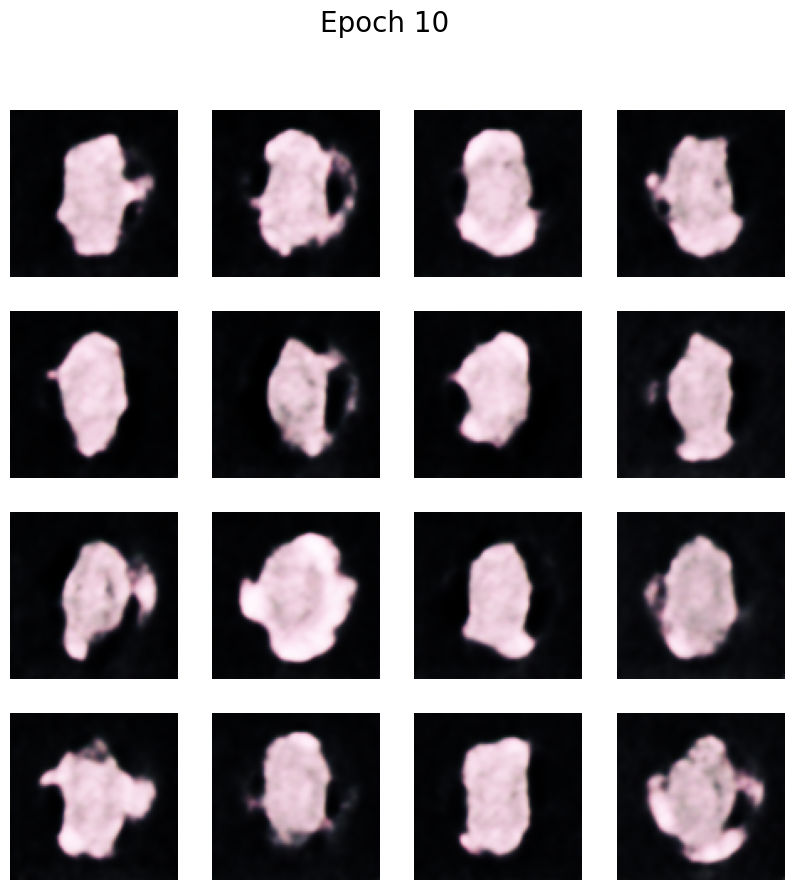

Epoch 11/100, Gen Loss: 1.3090, Disc Loss: 1.2869, Time: 3.23s
Epoch 12/100, Gen Loss: 1.3283, Disc Loss: 1.4459, Time: 3.28s
Epoch 13/100, Gen Loss: 1.3325, Disc Loss: 0.9451, Time: 3.35s
Epoch 14/100, Gen Loss: 1.2680, Disc Loss: 1.1182, Time: 3.40s
Epoch 15/100, Gen Loss: 1.3302, Disc Loss: 1.1882, Time: 3.45s
Epoch 16/100, Gen Loss: 1.3934, Disc Loss: 0.9904, Time: 3.54s
Epoch 17/100, Gen Loss: 1.3830, Disc Loss: 1.3195, Time: 3.60s
Epoch 18/100, Gen Loss: 1.3559, Disc Loss: 0.8964, Time: 3.64s
Epoch 19/100, Gen Loss: 1.5782, Disc Loss: 0.6752, Time: 3.68s
Epoch 20/100, Gen Loss: 1.2822, Disc Loss: 1.3951, Time: 3.72s


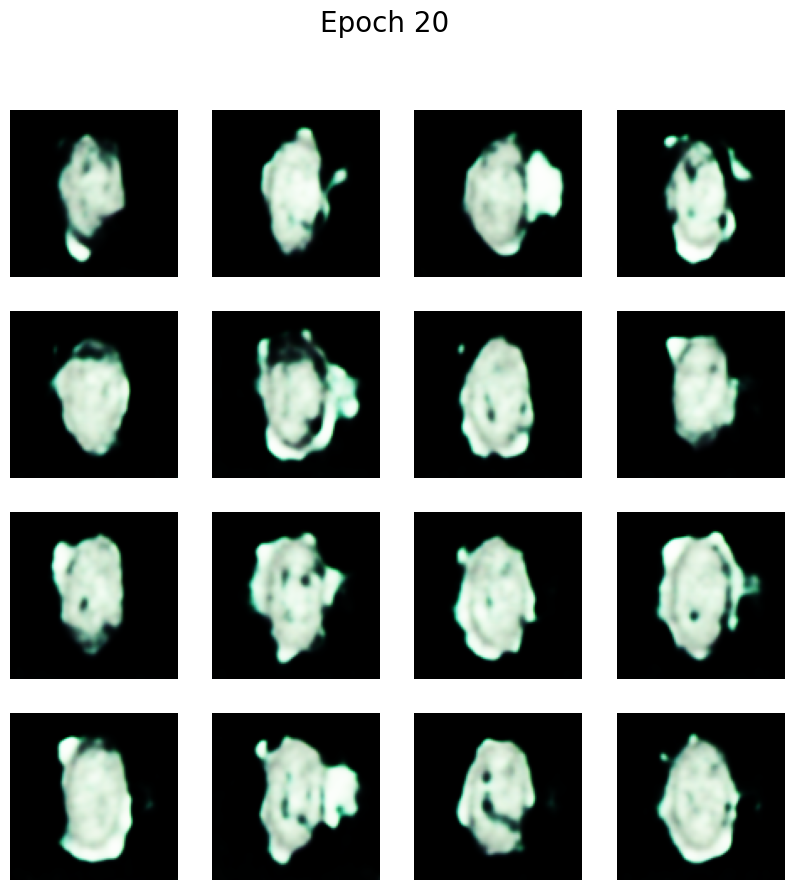

Epoch 21/100, Gen Loss: 1.2204, Disc Loss: 0.9291, Time: 3.75s
Epoch 22/100, Gen Loss: 1.0969, Disc Loss: 1.0305, Time: 3.77s
Epoch 23/100, Gen Loss: 1.1167, Disc Loss: 0.8975, Time: 3.74s
Epoch 24/100, Gen Loss: 1.1569, Disc Loss: 0.9873, Time: 3.69s
Epoch 25/100, Gen Loss: 1.2607, Disc Loss: 0.9874, Time: 3.63s
Epoch 26/100, Gen Loss: 1.2209, Disc Loss: 0.8183, Time: 3.59s
Epoch 27/100, Gen Loss: 1.2425, Disc Loss: 0.9497, Time: 3.58s
Epoch 28/100, Gen Loss: 1.1898, Disc Loss: 0.9898, Time: 3.54s
Epoch 29/100, Gen Loss: 1.1418, Disc Loss: 0.8532, Time: 3.51s
Epoch 30/100, Gen Loss: 1.2702, Disc Loss: 1.0789, Time: 3.49s


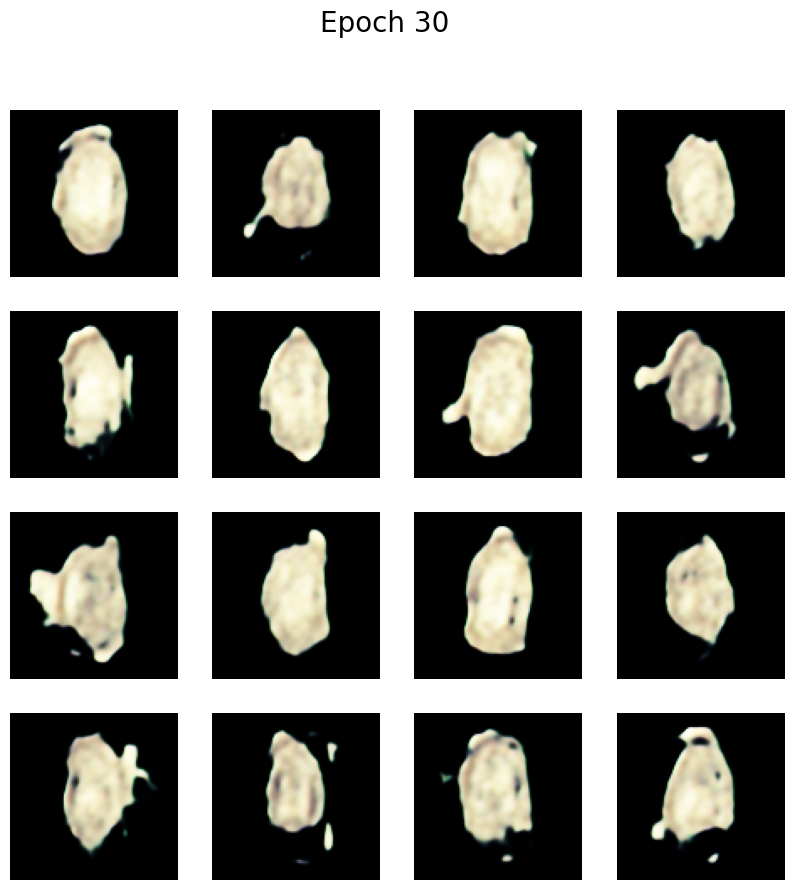

Epoch 31/100, Gen Loss: 1.0596, Disc Loss: 0.9961, Time: 3.45s
Epoch 32/100, Gen Loss: 1.1585, Disc Loss: 1.1859, Time: 3.45s
Epoch 33/100, Gen Loss: 1.0535, Disc Loss: 1.0080, Time: 3.44s
Epoch 34/100, Gen Loss: 1.0462, Disc Loss: 1.0068, Time: 3.44s
Epoch 35/100, Gen Loss: 1.0557, Disc Loss: 1.1118, Time: 3.43s
Epoch 36/100, Gen Loss: 1.0195, Disc Loss: 1.0461, Time: 3.41s
Epoch 37/100, Gen Loss: 1.0610, Disc Loss: 1.0456, Time: 3.42s
Epoch 38/100, Gen Loss: 0.9991, Disc Loss: 1.0691, Time: 3.42s
Epoch 39/100, Gen Loss: 1.0383, Disc Loss: 1.0729, Time: 3.42s
Epoch 40/100, Gen Loss: 1.1086, Disc Loss: 1.0263, Time: 3.42s


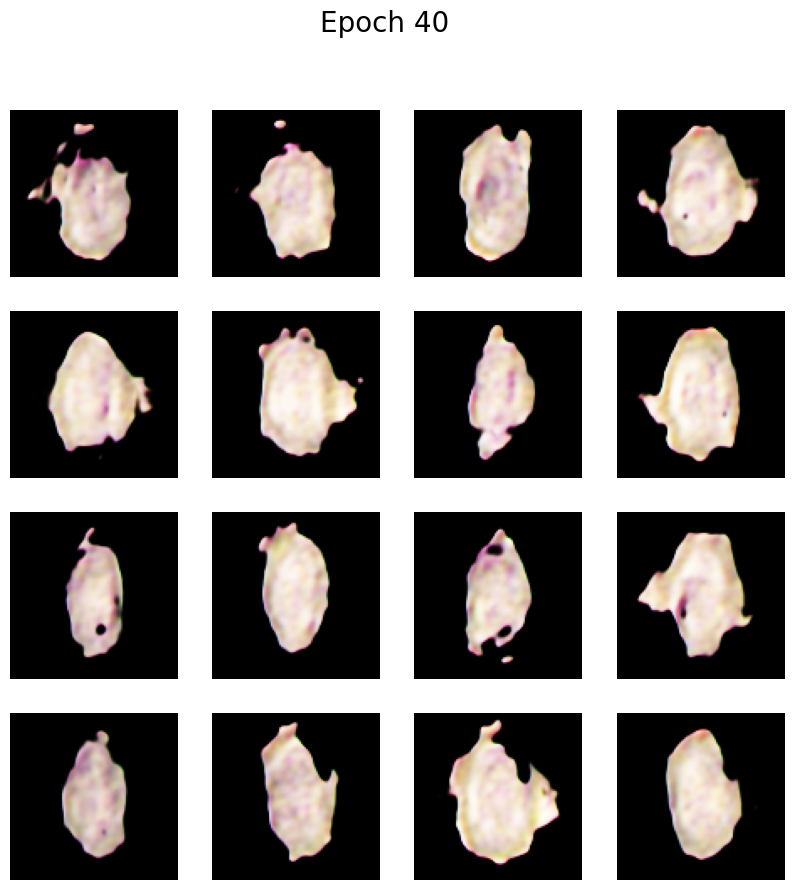

Epoch 41/100, Gen Loss: 1.1381, Disc Loss: 1.1739, Time: 3.42s
Epoch 42/100, Gen Loss: 1.0085, Disc Loss: 1.0095, Time: 3.43s
Epoch 43/100, Gen Loss: 1.0367, Disc Loss: 1.0844, Time: 3.43s
Epoch 44/100, Gen Loss: 1.0268, Disc Loss: 1.1425, Time: 3.44s
Epoch 45/100, Gen Loss: 1.0168, Disc Loss: 1.0950, Time: 3.44s
Epoch 46/100, Gen Loss: 0.9600, Disc Loss: 1.0669, Time: 3.47s
Epoch 47/100, Gen Loss: 1.0348, Disc Loss: 1.1345, Time: 3.47s
Epoch 48/100, Gen Loss: 1.0636, Disc Loss: 1.2279, Time: 3.46s
Epoch 49/100, Gen Loss: 0.9185, Disc Loss: 1.1100, Time: 3.46s
Epoch 50/100, Gen Loss: 0.9690, Disc Loss: 1.0729, Time: 3.43s


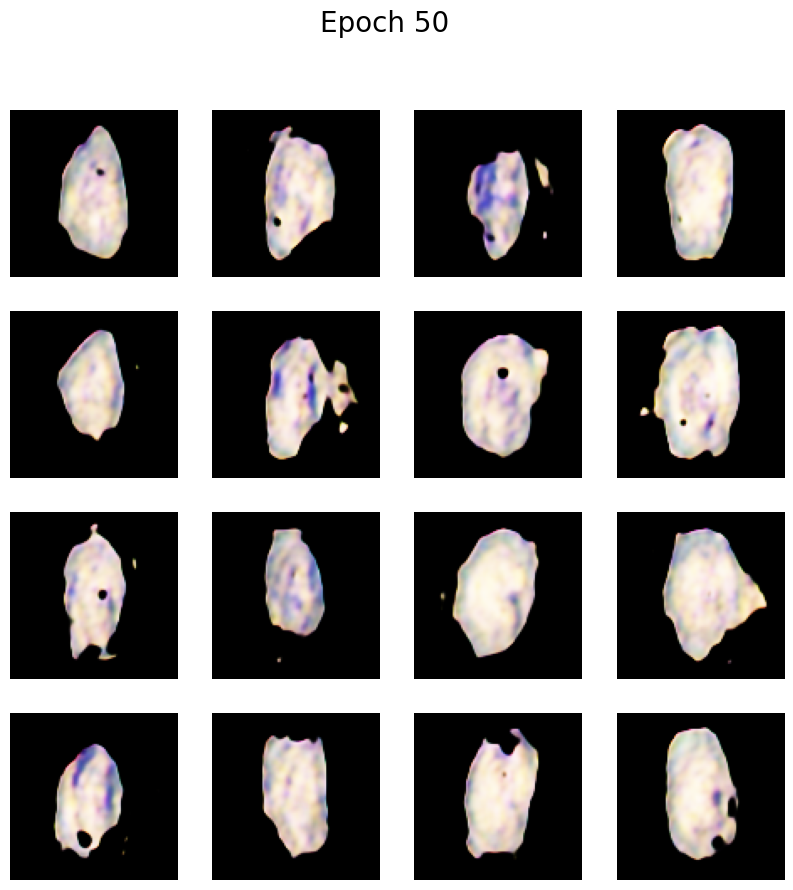

Epoch 51/100, Gen Loss: 1.2278, Disc Loss: 1.1209, Time: 3.43s
Epoch 52/100, Gen Loss: 1.1791, Disc Loss: 1.3072, Time: 3.43s
Epoch 53/100, Gen Loss: 0.8708, Disc Loss: 1.1472, Time: 3.42s
Epoch 54/100, Gen Loss: 0.9041, Disc Loss: 1.1287, Time: 3.42s
Epoch 55/100, Gen Loss: 0.8987, Disc Loss: 1.1062, Time: 3.41s
Epoch 56/100, Gen Loss: 0.9759, Disc Loss: 1.1655, Time: 3.42s
Epoch 57/100, Gen Loss: 0.9216, Disc Loss: 1.1641, Time: 3.42s
Epoch 58/100, Gen Loss: 0.9097, Disc Loss: 1.1078, Time: 3.42s
Epoch 59/100, Gen Loss: 0.9543, Disc Loss: 1.0883, Time: 3.42s
Epoch 60/100, Gen Loss: 0.9513, Disc Loss: 1.1011, Time: 3.42s


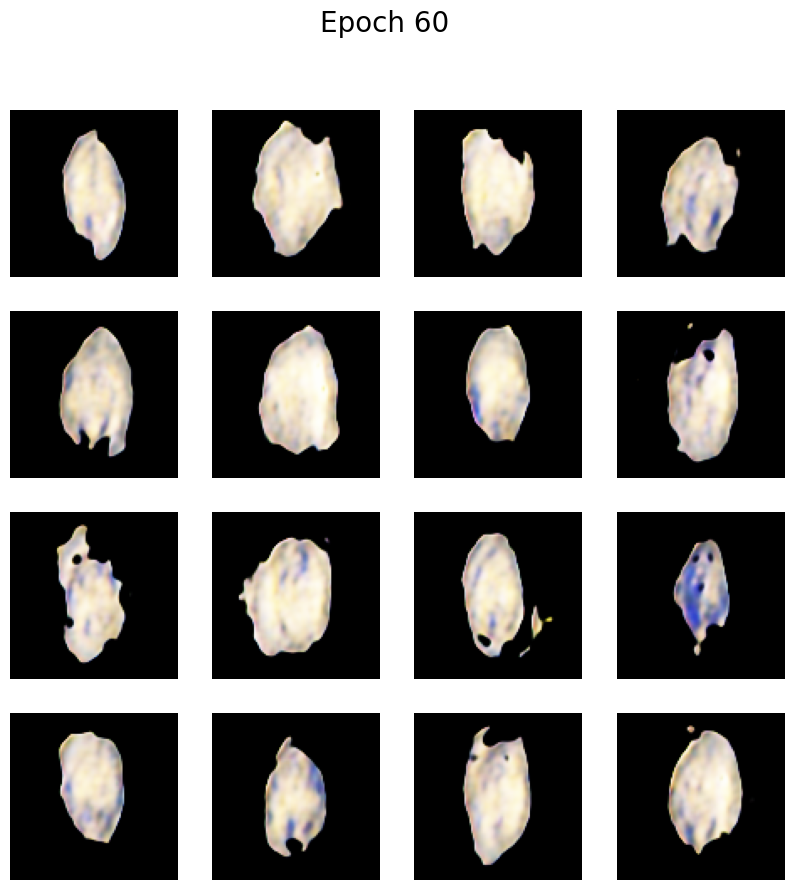

Epoch 61/100, Gen Loss: 0.9718, Disc Loss: 1.0930, Time: 3.39s
Epoch 62/100, Gen Loss: 0.9400, Disc Loss: 1.0736, Time: 3.42s
Epoch 63/100, Gen Loss: 0.9756, Disc Loss: 1.1239, Time: 3.41s
Epoch 64/100, Gen Loss: 0.9777, Disc Loss: 1.1066, Time: 3.41s
Epoch 65/100, Gen Loss: 0.9630, Disc Loss: 1.0512, Time: 3.42s
Epoch 66/100, Gen Loss: 1.0034, Disc Loss: 1.0741, Time: 3.42s
Epoch 67/100, Gen Loss: 0.9682, Disc Loss: 1.0558, Time: 3.42s
Epoch 68/100, Gen Loss: 0.9594, Disc Loss: 1.0530, Time: 3.42s
Epoch 69/100, Gen Loss: 0.9622, Disc Loss: 1.0597, Time: 3.43s
Epoch 70/100, Gen Loss: 0.9716, Disc Loss: 1.0633, Time: 3.42s


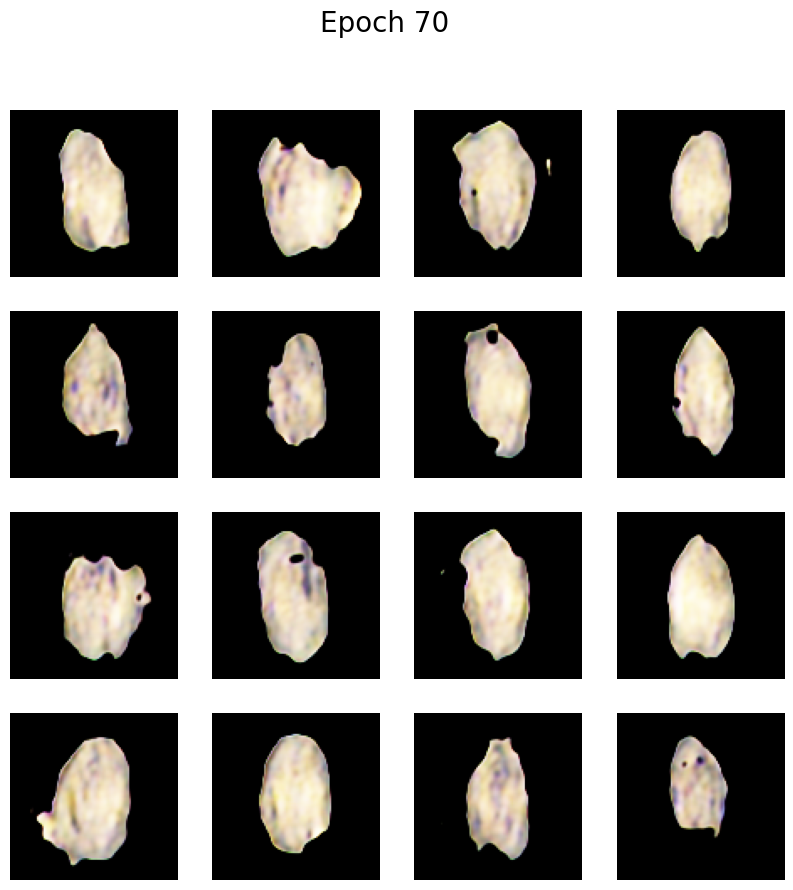

Epoch 71/100, Gen Loss: 1.0086, Disc Loss: 1.0593, Time: 3.42s
Epoch 72/100, Gen Loss: 0.9873, Disc Loss: 1.0881, Time: 3.44s
Epoch 73/100, Gen Loss: 0.9625, Disc Loss: 1.0639, Time: 3.44s
Epoch 74/100, Gen Loss: 0.9575, Disc Loss: 1.0479, Time: 3.44s
Epoch 75/100, Gen Loss: 1.0953, Disc Loss: 1.1907, Time: 3.44s
Epoch 76/100, Gen Loss: 0.9591, Disc Loss: 1.0519, Time: 3.44s
Epoch 77/100, Gen Loss: 0.9878, Disc Loss: 1.0134, Time: 3.44s
Epoch 78/100, Gen Loss: 1.0292, Disc Loss: 1.0232, Time: 3.45s
Epoch 79/100, Gen Loss: 1.0415, Disc Loss: 1.0329, Time: 3.44s
Epoch 80/100, Gen Loss: 0.9843, Disc Loss: 1.0317, Time: 3.44s


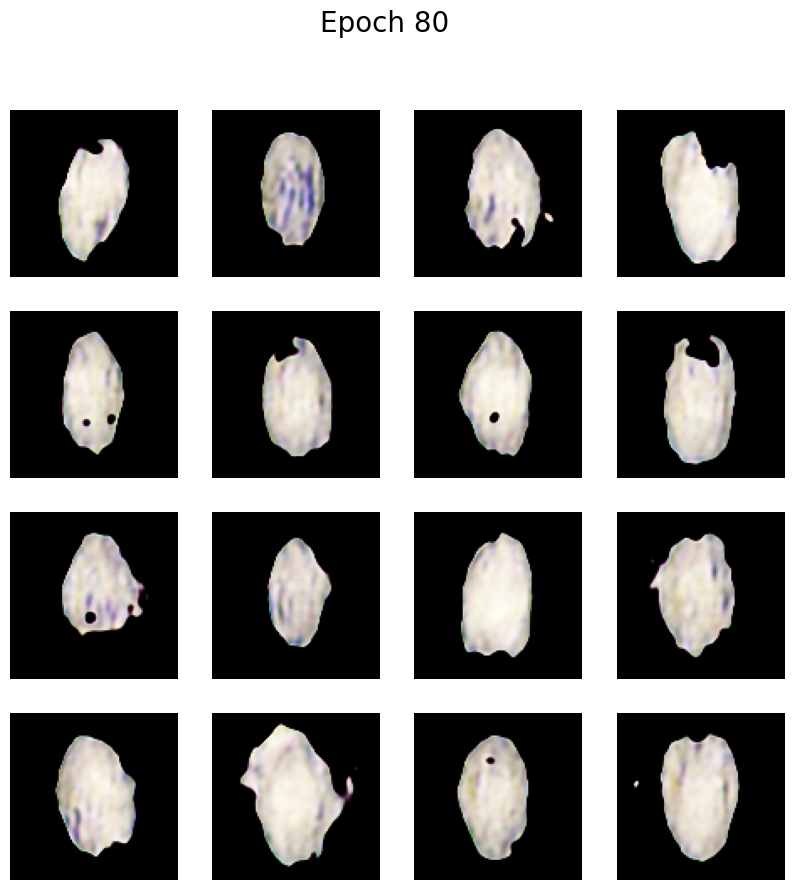

Epoch 81/100, Gen Loss: 0.9995, Disc Loss: 1.0420, Time: 3.41s
Epoch 82/100, Gen Loss: 0.9883, Disc Loss: 1.0347, Time: 3.43s
Epoch 83/100, Gen Loss: 1.0341, Disc Loss: 1.0571, Time: 3.43s
Epoch 84/100, Gen Loss: 0.9845, Disc Loss: 1.0550, Time: 3.42s
Epoch 85/100, Gen Loss: 1.0192, Disc Loss: 1.1210, Time: 3.43s
Epoch 86/100, Gen Loss: 0.9693, Disc Loss: 1.0684, Time: 3.43s
Epoch 87/100, Gen Loss: 0.9849, Disc Loss: 1.0749, Time: 3.41s
Epoch 88/100, Gen Loss: 1.0174, Disc Loss: 1.0542, Time: 3.41s
Epoch 89/100, Gen Loss: 1.0934, Disc Loss: 1.1822, Time: 3.41s
Epoch 90/100, Gen Loss: 0.9664, Disc Loss: 1.0832, Time: 3.41s


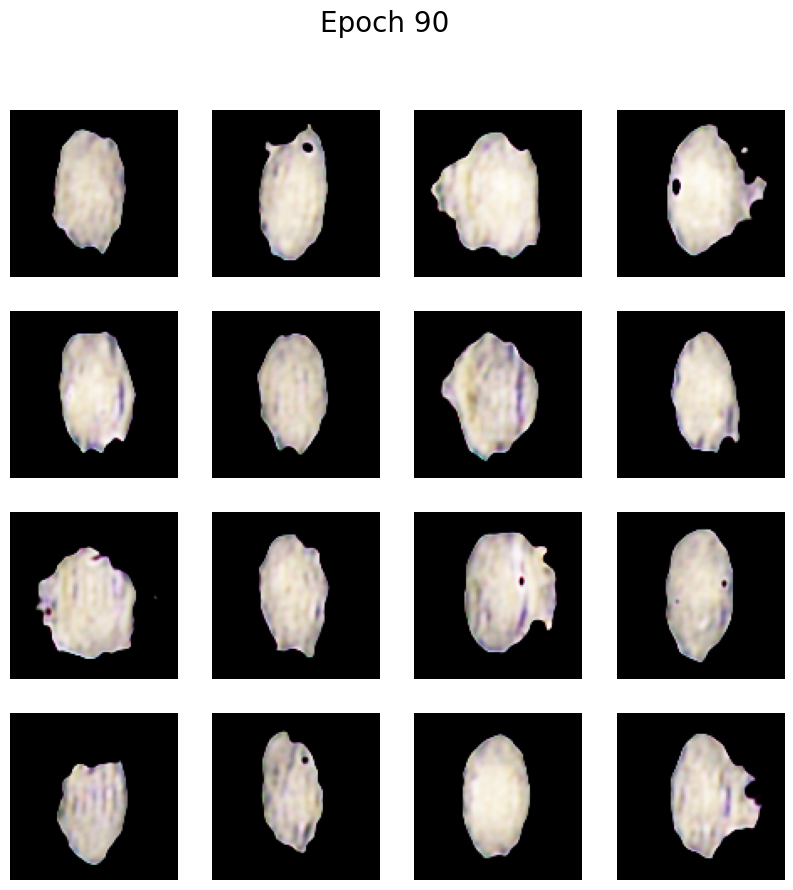

Epoch 91/100, Gen Loss: 0.9677, Disc Loss: 1.0414, Time: 3.41s
Epoch 92/100, Gen Loss: 0.9779, Disc Loss: 1.0331, Time: 3.41s
Epoch 93/100, Gen Loss: 1.0120, Disc Loss: 1.0532, Time: 3.41s
Epoch 94/100, Gen Loss: 0.9963, Disc Loss: 1.0058, Time: 3.41s
Epoch 95/100, Gen Loss: 1.0232, Disc Loss: 0.9866, Time: 3.42s
Epoch 96/100, Gen Loss: 1.0056, Disc Loss: 1.0166, Time: 3.40s
Epoch 97/100, Gen Loss: 0.9893, Disc Loss: 1.0248, Time: 3.41s
Epoch 98/100, Gen Loss: 1.0072, Disc Loss: 1.0464, Time: 3.42s
Epoch 99/100, Gen Loss: 1.0621, Disc Loss: 1.0221, Time: 3.42s
Epoch 100/100, Gen Loss: 1.0158, Disc Loss: 1.0006, Time: 3.42s


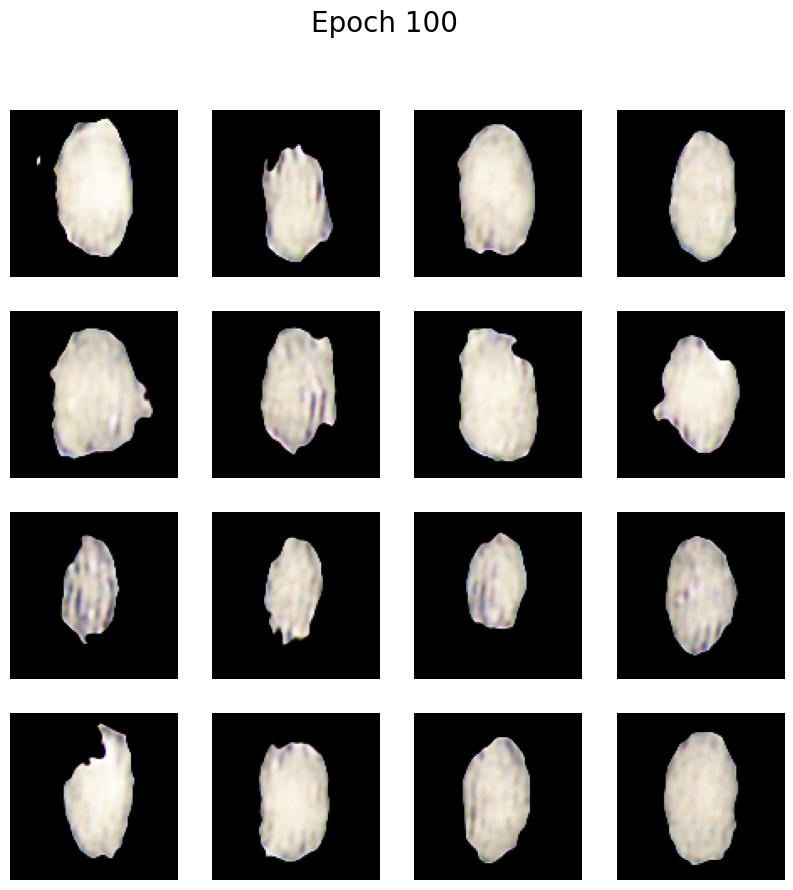

In [19]:
def train(epochs, dataset):
  gen_loss_history = []
  disc_loss_history = []
  
  for epoch in range(epochs):
    start = time.time()
    epoch_gen_loss = 0
    epoch_disc_loss = 0
    num_batches = 0
    
    for image_batch in dataset:
      gen_loss, disc_loss = train_step(image_batch)
      epoch_gen_loss += gen_loss
      epoch_disc_loss += disc_loss
      num_batches += 1
    
    avg_gen_loss = epoch_gen_loss / num_batches
    avg_disc_loss = epoch_disc_loss / num_batches
    
    gen_loss_history.append(avg_gen_loss.numpy())
    disc_loss_history.append(avg_disc_loss.numpy())
    
    print(f'Epoch {epoch+1}/{epochs}, Gen Loss: {avg_gen_loss:.4f}, Disc Loss: {avg_disc_loss:.4f}, Time: {time.time()-start:.2f}s')
    
    if (epoch + 1) % 10 == 0:
      test_noise = tf.random.normal([16, latent_dim])
      generated_images = generator(test_noise, training=False)
      
      plt.figure(figsize=(10, 10))
      for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(generated_images[i] * 0.5 + 0.5)
        plt.axis('off')
      plt.suptitle(f'Epoch {epoch+1}', fontsize=20)
      plt.show()

  return gen_loss_history, disc_loss_history

gen_losses, disc_losses = train(100, dataset)

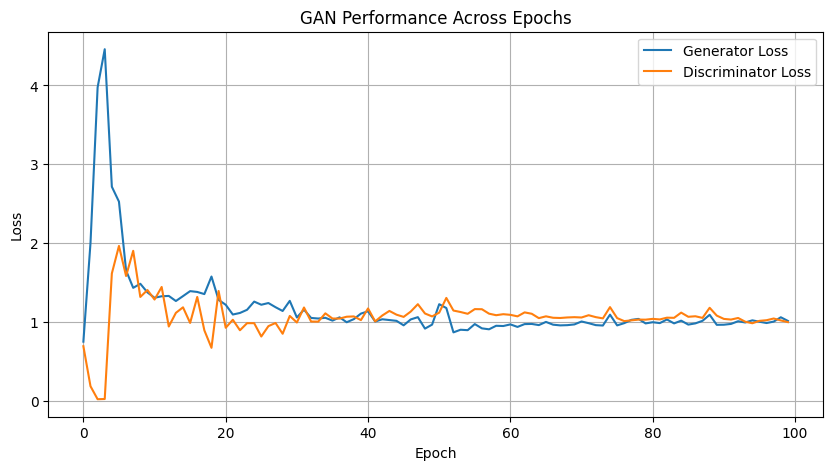

In [22]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.title('GAN Performance Across Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Grafik yang ditunjukkan menggambarkan kinerja Generative Adversarial Network (GAN) selama beberapa epoch, dengan membandingkan loss dari generator dan diskriminator. Pada awalnya, kedua loss menunjukkan fluktuasi yang signifikan, terutama pada epoch pertama hingga ke-10, yang umum terjadi pada proses pelatihan GAN karena kedua model tersebut saling beradaptasi. Setelah itu, kedua loss mulai stabil sekitar epoch ke-20 hingga ke-30, yang menandakan bahwa generator dan diskriminator telah menemukan keseimbangan yang cukup baik dalam proses pembelajaran. Setelah epoch ke-30, kedua loss cenderung datar dan stabil, dengan loss generator sedikit lebih tinggi dari diskriminator, yang menunjukkan bahwa meskipun generator semakin baik dalam menghasilkan gambar, ia masih sedikit kesulitan untuk menghasilkan sampel yang sempurna. Secara keseluruhan, grafik ini menunjukkan bahwa GAN telah berhasil berlatih dengan baik, dengan konvergensi yang stabil setelah periode ketidakstabilan di awal pelatihan.

In [23]:
def calculate_fid(real_images, generated_images, batch_size=8):
  inception = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
  
  def preprocess_for_inception(images):
    resized_images = []
    for img in images:
      img = (img + 1) * 127.5  
      img = cv2.resize(img, (299, 299))
      
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      
      img = img.astype(np.float32) / 127.5 - 1.0  
      
      resized_images.append(img)
    return np.array(resized_images)
  
  real_images = preprocess_for_inception(real_images)
  generated_images = preprocess_for_inception(generated_images)
  
  def get_activations(images, model, batch_size=32):
    n_batches = len(images) // batch_size
    act = []
    for i in range(n_batches):
      batch = images[i*batch_size:(i+1)*batch_size]
      act_batch = model.predict(batch)
      act.append(act_batch)
    return np.concatenate(act, axis=0)
  
  act_real = get_activations(real_images, inception, batch_size)
  act_gen = get_activations(generated_images, inception, batch_size)
  
  mu1 = act_real.mean(axis=0)
  mu2 = act_gen.mean(axis=0)
  sigma1 = np.cov(act_real, rowvar=True)
  sigma2 = np.cov(act_gen, rowvar=True)
  
  diff = mu1 - mu2
  covmean = sqrtm(sigma1.dot(sigma2))
  if np.iscomplexobj(covmean):
    covmean = covmean.real
  
  fid = (diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean))
  return fid

In [24]:
def generate_samples(model, n_samples, batch_size=32):
  samples = []
  for _ in range(int(np.ceil(n_samples / batch_size))):
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generated = model.predict(noise, verbose=0) 
    samples.append(generated)
  return np.concatenate(samples, axis=0)[:n_samples]

def prepare_real_samples(real_images, n_samples):
  ix = np.random.randint(0, real_images.shape[0], n_samples)
  return real_images[ix]  

I0000 00:00:1751090879.868255     103 service.cc:148] XLA service 0x7bc86c0041a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751090879.869066     103 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1751090879.869086     103 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1751090880.643968     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
FID Score: 118.88


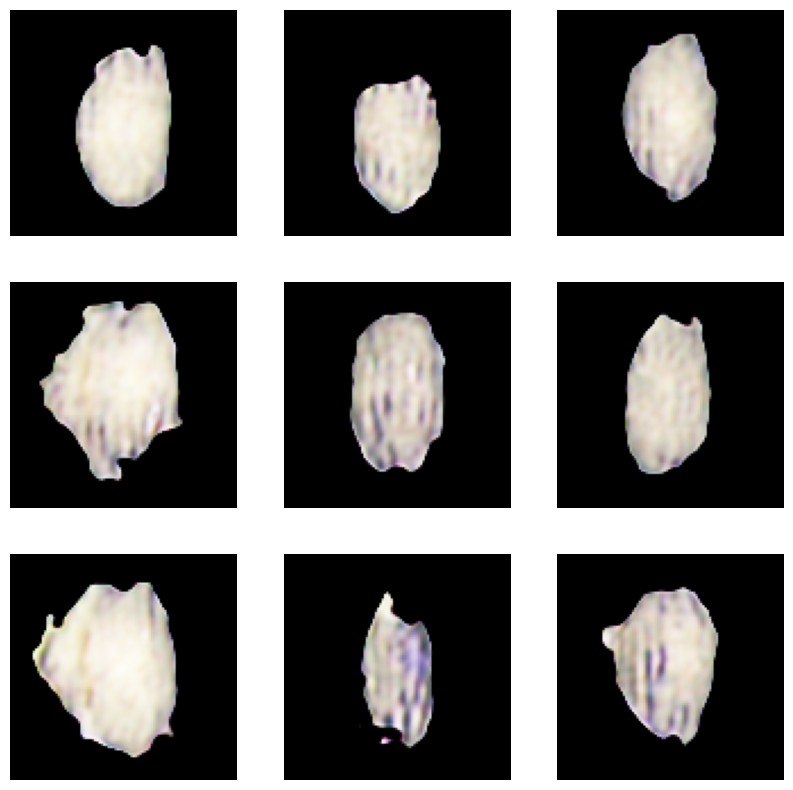

In [27]:
n_samples = min(100, len(real_images))
real_images_sample = real_images[:n_samples]

fake_images = generate_samples(generator, n_samples, batch_size=8)

fid_score = calculate_fid(real_images_sample, fake_images, batch_size=8)
print(f"FID Score: {fid_score:.2f}")

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow((fake_images[i] + 1) / 2.0)
    plt.axis('off')
plt.show()


## Modified

In [28]:
def Modified_Generator(latent_dim=100, num_channels=3):
  model = tf.keras.Sequential(name="Generator_Modified")

  model.add(tf.keras.layers.InputLayer(input_shape=(latent_dim,)))
  model.add(tf.keras.layers.Dense(35 * 35 * 64))
  model.add(tf.keras.layers.ReLU())
  model.add(tf.keras.layers.Reshape((35, 35, 64)))

  model.add(tf.keras.layers.UpSampling2D(size=(2, 2)))
  model.add(tf.keras.layers.Conv2D(16, kernel_size=3, strides=1, padding='valid'))
  model.add(tf.keras.layers.ReLU())

  model.add(tf.keras.layers.UpSampling2D(size=(2, 2)))
  model.add(tf.keras.layers.Conv2D(32, kernel_size=3, strides=1, padding='valid'))
  model.add(tf.keras.layers.ReLU())

  model.add(tf.keras.layers.UpSampling2D(size=(2, 2)))
  model.add(tf.keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='valid'))
  model.add(tf.keras.layers.ReLU())

  model.add(tf.keras.layers.Conv2D(num_channels, kernel_size=1, strides=1, padding='valid', activation='tanh'))

  model.add(tf.keras.layers.Cropping2D(cropping=((83, 83), (83, 83))))

  return model

m_generator= Modified_Generator()
m_generator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "Generator_Modified"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 78400)               │       7,918,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 78400)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 35, 35, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_2 (UpSampling2D)       │ (None, 70, 70, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_101 (Conv2D)                  │ (None, 68, 68, 16)          │           9,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 68, 68, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_3 (UpSampling2D)       │ (None, 136, 136, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_102 (Conv2D)                  │ (None, 134, 134, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 134, 134, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_4 (UpSampling2D)       │ (None, 268, 268, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_103 (Conv2D)                  │ (None, 266, 266, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 266, 266, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_104 (Conv2D)                  │ (None, 266, 266, 3)         │             195 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cropping2d_1 (Cropping2D)            │ (None, 100, 100, 3)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,950,963 (30.33 MB)

 Trainable params: 7,950,963 (30.33 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
def Modified_Discriminator(image_shape=(100,100,3)):
  model = Sequential(name="Discriminator_HighCapacity")
    
  model.add(layers.Conv2D(16, (3, 3), strides=1, padding='valid', activation='relu', input_shape= image_shape))
  model.add(layers.Dropout(0.3))

  model.add(layers.Conv2D(32, (3, 3), strides=1, padding='valid',  activation='relu'))
  model.add(layers.Dropout(0.3))

  model.add(layers.Conv2D(64, (3, 3), strides=1, padding='valid',  activation='relu'))

  model.add(layers.Flatten())
  model.add(layers.Dense(1, activation='sigmoid'))
  
  return model

m_discriminator= Modified_Discriminator()
m_discriminator.summary()

Model: "Discriminator_HighCapacity"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_108 (Conv2D)                  │ (None, 98, 98, 16)          │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 98, 98, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_109 (Conv2D)                  │ (None, 96, 96, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 96, 96, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_110 (Conv2D)                  │ (None, 94, 94, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 565504)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │         565,505 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 589,089 (2.25 MB)

 Trainable params: 589,089 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
m_generator_optimizer= tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)
m_discriminator_optimizer= tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)

In [32]:
@tf.function
def m_train_step(images):
  noise = tf.random.normal([batch_size, latent_dim])
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = m_generator(noise, training=True)
    
    real_output = m_discriminator(images, training=True)
    fake_output = m_discriminator(generated_images, training=True)
    
    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(fake_output, real_output)
  
  gen_gradients = gen_tape.gradient(gen_loss, m_generator.trainable_variables)
  disc_gradients = disc_tape.gradient(disc_loss, m_discriminator.trainable_variables)
  
  m_generator_optimizer.apply_gradients(zip(gen_gradients, m_generator.trainable_variables))
  m_discriminator_optimizer.apply_gradients(zip(disc_gradients, m_discriminator.trainable_variables))
  
  return gen_loss, disc_loss

In [33]:
def m_train(epochs, dataset):
  gen_loss_history = []
  disc_loss_history = []
  
  for epoch in range(epochs):
    start = time.time()
    total_gen_loss = 0
    total_disc_loss = 0
    num_batches = 0
    
    for image_batch in dataset:
      gen_loss, disc_loss = m_train_step(image_batch)
      total_gen_loss += gen_loss
      total_disc_loss += disc_loss
      num_batches += 1
    
    avg_gen_loss = total_gen_loss / num_batches
    avg_disc_loss = total_disc_loss / num_batches
    
    gen_loss_history.append(avg_gen_loss.numpy())
    disc_loss_history.append(avg_disc_loss.numpy())
    
    if (epoch + 1) % 10 == 0:
      test_noise = tf.random.normal([16, latent_dim])
      generated_images = m_generator(test_noise, training=False)
      
      plt.figure(figsize=(10, 10))
      for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(generated_images[i] * 0.5 + 0.5)
        plt.axis('off')
      plt.show()
    
    print(f'Epoch {epoch+1}/{epochs} | '
          f'Generator Loss: {avg_gen_loss:.4f} | '
          f'Discriminator Loss: {avg_disc_loss:.4f} | '
          f'Time: {time.time()-start:.2f}s')
  
  return gen_loss_history, disc_loss_history

E0000 00:00:1751090924.517339      35 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_HighCapacity_1/dropout_2_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch 1/200 | Generator Loss: 0.6517 | Discriminator Loss: 0.7874 | Time: 19.91s
Epoch 2/200 | Generator Loss: 0.9950 | Discriminator Loss: 0.4713 | Time: 8.86s
Epoch 3/200 | Generator Loss: 1.6036 | Discriminator Loss: 0.3013 | Time: 8.80s
Epoch 4/200 | Generator Loss: 2.1348 | Discriminator Loss: 0.3374 | Time: 8.38s
Epoch 5/200 | Generator Loss: 3.3558 | Discriminator Loss: 0.0689 | Time: 8.22s
Epoch 6/200 | Generator Loss: 3.0775 | Discriminator Loss: 0.1192 | Time: 8.06s
Epoch 7/200 | Generator Loss: 2.9733 | Discriminator Loss: 2.2325 | Time: 7.96s
Epoch 8/200 | Generator Loss: 2.1762 | Discriminator Loss: 0.5379 | Time: 7.98s
Epoch 9/200 | Generator Loss: 1.6508 | Discriminator Loss: 1.3306 | Time: 8.07s


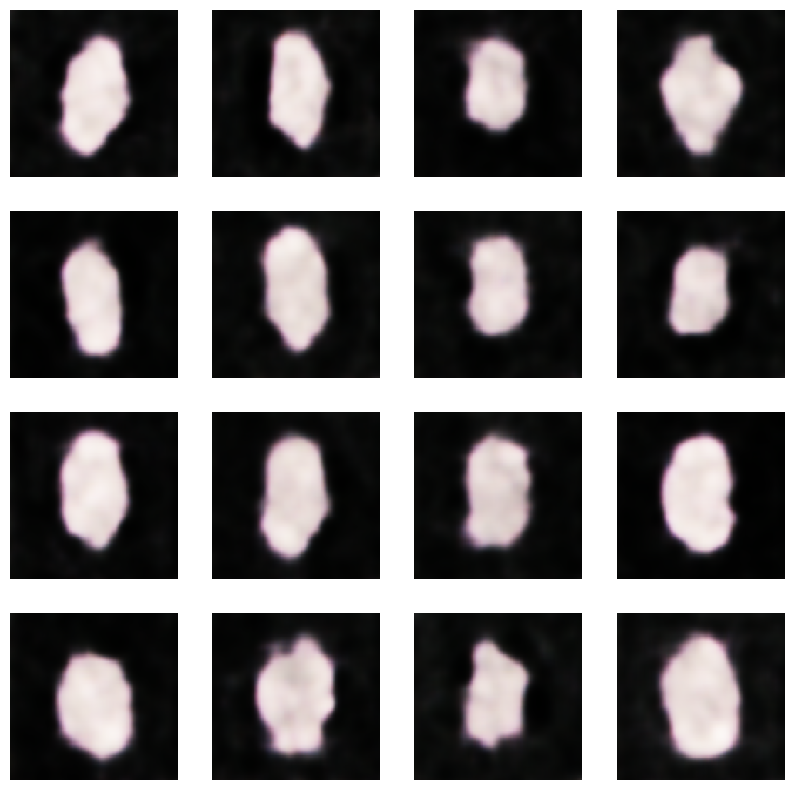

Epoch 10/200 | Generator Loss: 1.6681 | Discriminator Loss: 1.1846 | Time: 9.18s
Epoch 11/200 | Generator Loss: 1.3785 | Discriminator Loss: 1.5629 | Time: 8.23s
Epoch 12/200 | Generator Loss: 1.1599 | Discriminator Loss: 1.3076 | Time: 8.29s
Epoch 13/200 | Generator Loss: 1.0877 | Discriminator Loss: 1.1678 | Time: 8.28s
Epoch 14/200 | Generator Loss: 1.1254 | Discriminator Loss: 1.3156 | Time: 8.24s
Epoch 15/200 | Generator Loss: 1.0681 | Discriminator Loss: 1.3313 | Time: 8.23s
Epoch 16/200 | Generator Loss: 0.9262 | Discriminator Loss: 1.1222 | Time: 8.20s
Epoch 17/200 | Generator Loss: 0.9906 | Discriminator Loss: 1.3711 | Time: 8.16s
Epoch 18/200 | Generator Loss: 0.8812 | Discriminator Loss: 1.3498 | Time: 8.15s
Epoch 19/200 | Generator Loss: 0.8550 | Discriminator Loss: 1.3233 | Time: 8.15s


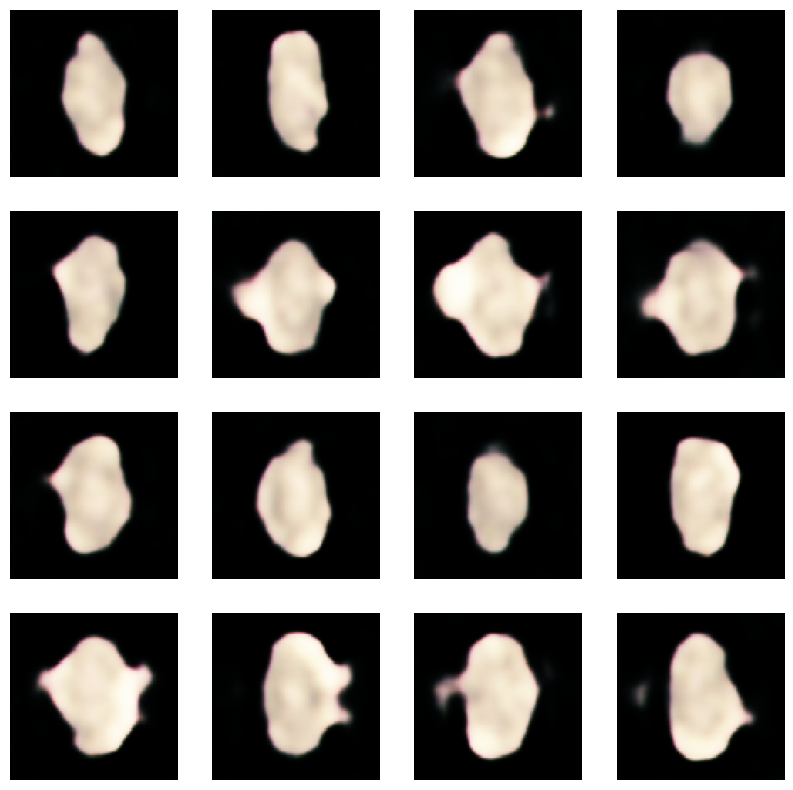

Epoch 20/200 | Generator Loss: 0.8754 | Discriminator Loss: 1.3105 | Time: 8.71s
Epoch 21/200 | Generator Loss: 0.9099 | Discriminator Loss: 1.2538 | Time: 8.15s
Epoch 22/200 | Generator Loss: 0.9339 | Discriminator Loss: 1.1666 | Time: 8.19s
Epoch 23/200 | Generator Loss: 0.9896 | Discriminator Loss: 1.2442 | Time: 8.23s
Epoch 24/200 | Generator Loss: 0.9906 | Discriminator Loss: 1.2370 | Time: 8.23s
Epoch 25/200 | Generator Loss: 1.0157 | Discriminator Loss: 1.3348 | Time: 8.23s
Epoch 26/200 | Generator Loss: 0.9133 | Discriminator Loss: 1.1947 | Time: 8.24s
Epoch 27/200 | Generator Loss: 0.9876 | Discriminator Loss: 1.1175 | Time: 8.23s
Epoch 28/200 | Generator Loss: 1.0391 | Discriminator Loss: 1.0285 | Time: 8.23s
Epoch 29/200 | Generator Loss: 1.0257 | Discriminator Loss: 1.0767 | Time: 8.23s


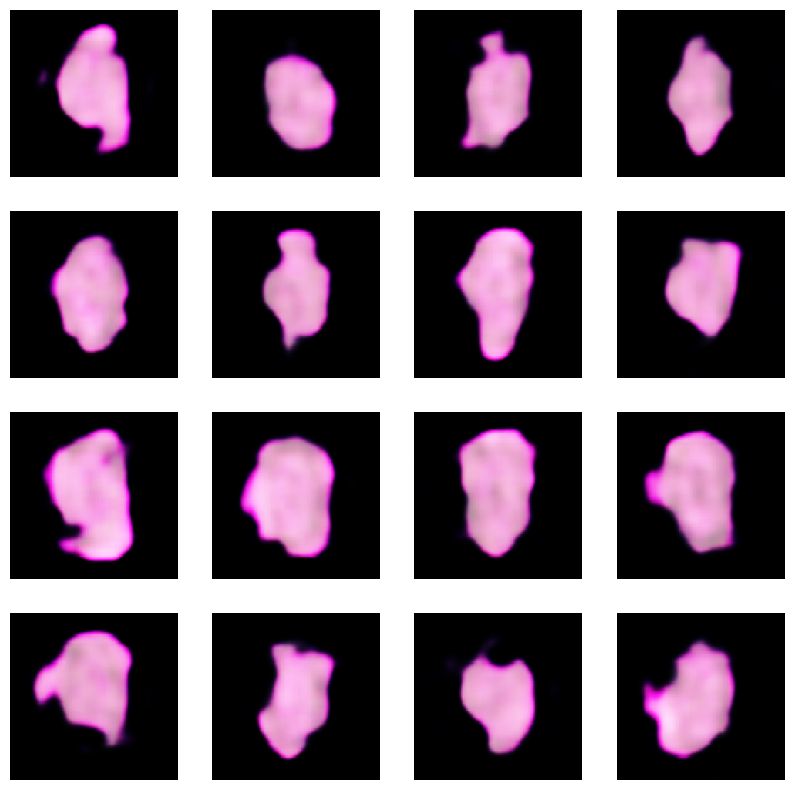

Epoch 30/200 | Generator Loss: 1.1502 | Discriminator Loss: 1.0311 | Time: 8.78s
Epoch 31/200 | Generator Loss: 1.3099 | Discriminator Loss: 1.2016 | Time: 8.21s
Epoch 32/200 | Generator Loss: 0.5238 | Discriminator Loss: 2.1967 | Time: 8.25s
Epoch 33/200 | Generator Loss: 1.6545 | Discriminator Loss: 0.5135 | Time: 8.25s
Epoch 34/200 | Generator Loss: 1.3635 | Discriminator Loss: 1.3057 | Time: 8.23s
Epoch 35/200 | Generator Loss: 0.8168 | Discriminator Loss: 1.4195 | Time: 8.22s
Epoch 36/200 | Generator Loss: 0.8639 | Discriminator Loss: 1.2944 | Time: 8.23s
Epoch 37/200 | Generator Loss: 0.9946 | Discriminator Loss: 1.0223 | Time: 8.23s
Epoch 38/200 | Generator Loss: 0.9252 | Discriminator Loss: 1.1463 | Time: 8.23s
Epoch 39/200 | Generator Loss: 0.7940 | Discriminator Loss: 1.2851 | Time: 8.24s


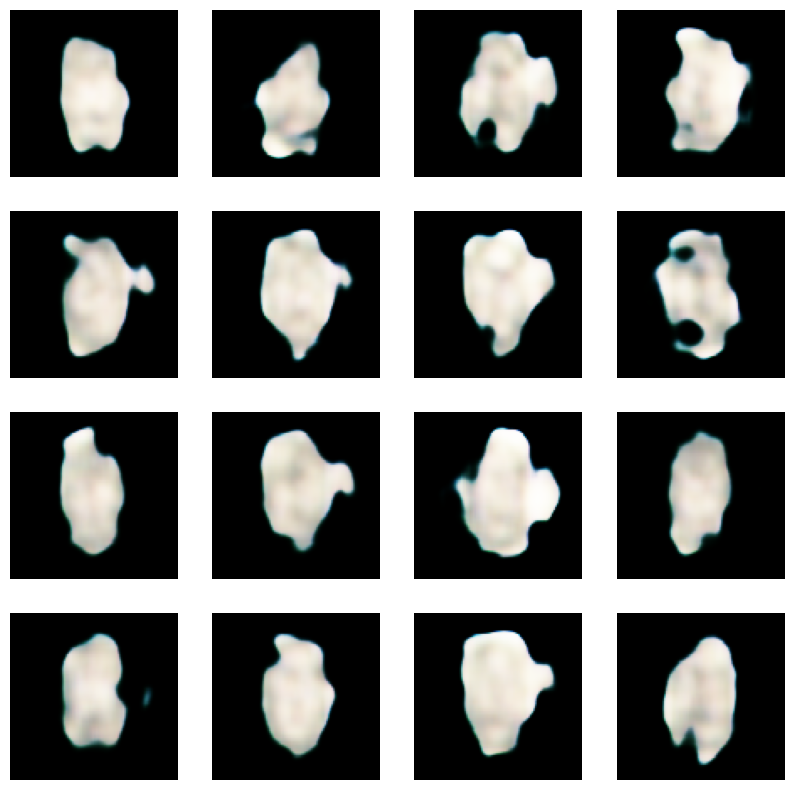

Epoch 40/200 | Generator Loss: 0.8914 | Discriminator Loss: 1.1560 | Time: 11.13s
Epoch 41/200 | Generator Loss: 0.9025 | Discriminator Loss: 1.2023 | Time: 8.14s
Epoch 42/200 | Generator Loss: 0.8977 | Discriminator Loss: 1.2454 | Time: 8.21s
Epoch 43/200 | Generator Loss: 0.9015 | Discriminator Loss: 1.2099 | Time: 8.24s
Epoch 44/200 | Generator Loss: 0.9269 | Discriminator Loss: 1.1297 | Time: 8.28s
Epoch 45/200 | Generator Loss: 1.0111 | Discriminator Loss: 1.2140 | Time: 8.28s
Epoch 46/200 | Generator Loss: 0.8663 | Discriminator Loss: 1.1563 | Time: 8.24s
Epoch 47/200 | Generator Loss: 0.9329 | Discriminator Loss: 1.2866 | Time: 8.23s
Epoch 48/200 | Generator Loss: 0.8533 | Discriminator Loss: 1.2569 | Time: 8.24s
Epoch 49/200 | Generator Loss: 0.8652 | Discriminator Loss: 1.3848 | Time: 8.24s


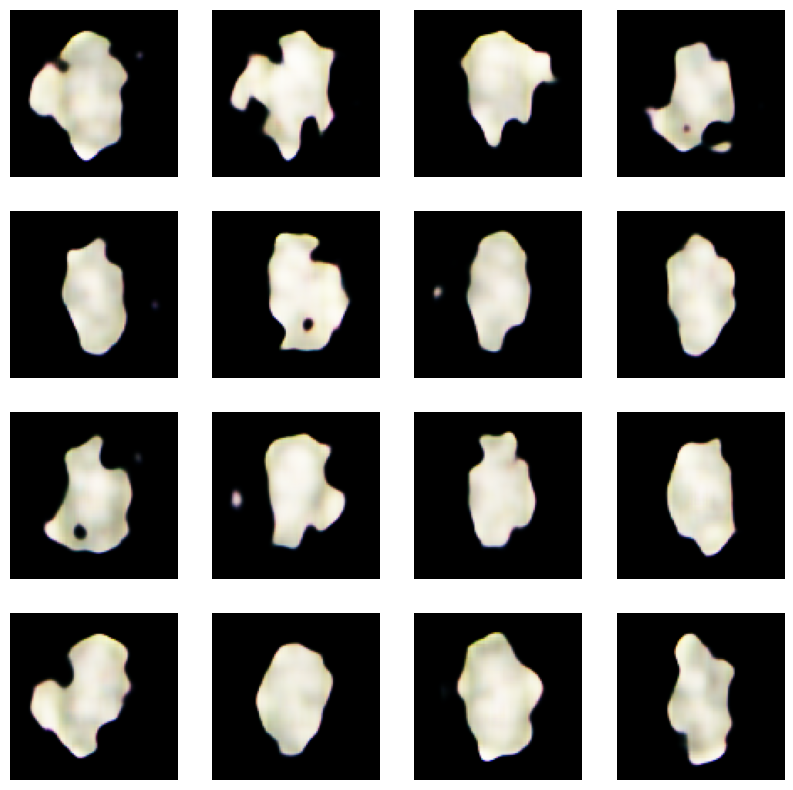

Epoch 50/200 | Generator Loss: 0.9051 | Discriminator Loss: 1.2951 | Time: 8.74s
Epoch 51/200 | Generator Loss: 0.8876 | Discriminator Loss: 1.2122 | Time: 8.21s
Epoch 52/200 | Generator Loss: 0.8638 | Discriminator Loss: 1.1947 | Time: 8.23s
Epoch 53/200 | Generator Loss: 0.8307 | Discriminator Loss: 1.2654 | Time: 8.23s
Epoch 54/200 | Generator Loss: 0.8129 | Discriminator Loss: 1.2502 | Time: 8.23s
Epoch 55/200 | Generator Loss: 0.8150 | Discriminator Loss: 1.3979 | Time: 8.23s
Epoch 56/200 | Generator Loss: 0.8132 | Discriminator Loss: 1.3819 | Time: 8.22s
Epoch 57/200 | Generator Loss: 0.8018 | Discriminator Loss: 1.3108 | Time: 8.24s
Epoch 58/200 | Generator Loss: 0.8210 | Discriminator Loss: 1.2929 | Time: 8.22s
Epoch 59/200 | Generator Loss: 0.7970 | Discriminator Loss: 1.2856 | Time: 8.23s


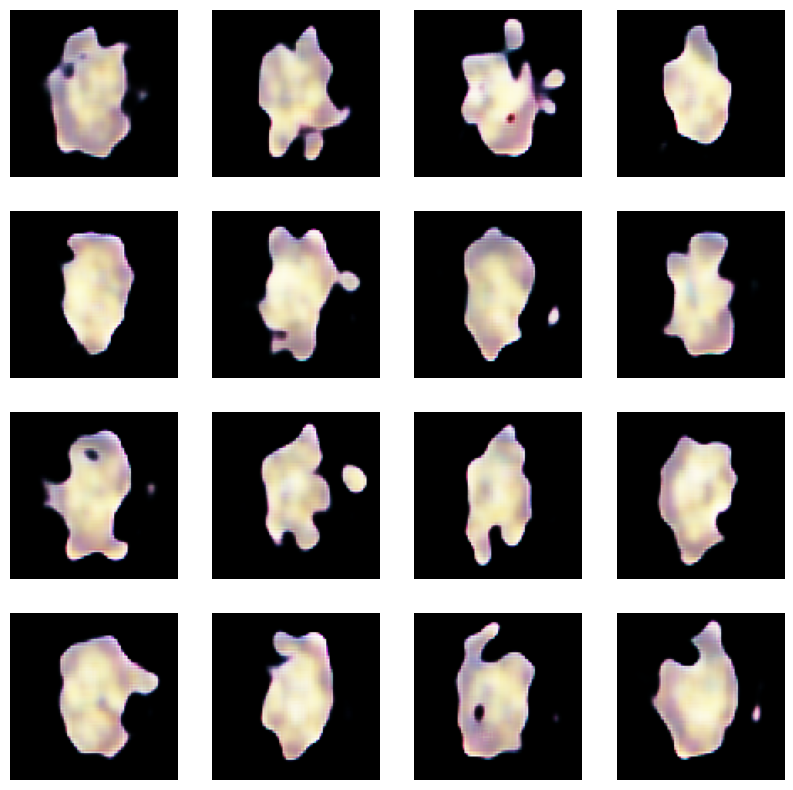

Epoch 60/200 | Generator Loss: 0.8396 | Discriminator Loss: 1.2230 | Time: 8.71s
Epoch 61/200 | Generator Loss: 0.8583 | Discriminator Loss: 1.2374 | Time: 8.19s
Epoch 62/200 | Generator Loss: 0.8555 | Discriminator Loss: 1.2302 | Time: 8.23s
Epoch 63/200 | Generator Loss: 0.8551 | Discriminator Loss: 1.2354 | Time: 8.21s
Epoch 64/200 | Generator Loss: 0.8275 | Discriminator Loss: 1.2623 | Time: 8.24s
Epoch 65/200 | Generator Loss: 0.8241 | Discriminator Loss: 1.2630 | Time: 8.24s
Epoch 66/200 | Generator Loss: 0.8402 | Discriminator Loss: 1.3110 | Time: 8.23s
Epoch 67/200 | Generator Loss: 0.8034 | Discriminator Loss: 1.2861 | Time: 8.21s
Epoch 68/200 | Generator Loss: 0.7946 | Discriminator Loss: 1.3049 | Time: 8.21s
Epoch 69/200 | Generator Loss: 0.8266 | Discriminator Loss: 1.3319 | Time: 8.23s


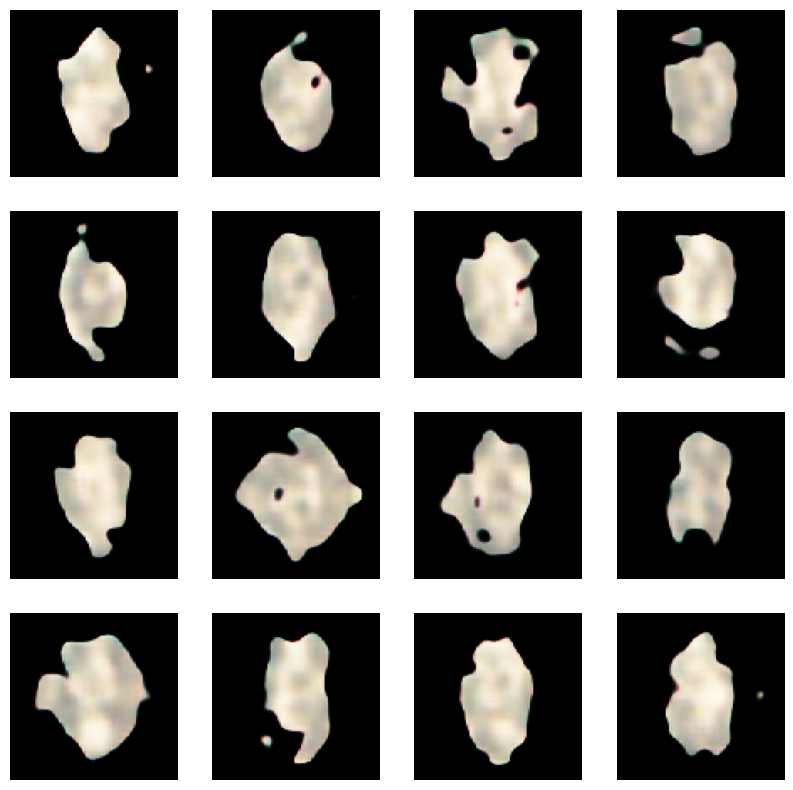

Epoch 70/200 | Generator Loss: 0.7939 | Discriminator Loss: 1.3460 | Time: 8.68s
Epoch 71/200 | Generator Loss: 0.7930 | Discriminator Loss: 1.3294 | Time: 8.17s
Epoch 72/200 | Generator Loss: 0.7710 | Discriminator Loss: 1.3261 | Time: 8.18s
Epoch 73/200 | Generator Loss: 0.7536 | Discriminator Loss: 1.3430 | Time: 8.19s
Epoch 74/200 | Generator Loss: 0.7707 | Discriminator Loss: 1.3754 | Time: 8.19s
Epoch 75/200 | Generator Loss: 0.7383 | Discriminator Loss: 1.3763 | Time: 8.19s
Epoch 76/200 | Generator Loss: 0.8002 | Discriminator Loss: 1.3568 | Time: 8.21s
Epoch 77/200 | Generator Loss: 0.7961 | Discriminator Loss: 1.2907 | Time: 8.21s
Epoch 78/200 | Generator Loss: 0.8021 | Discriminator Loss: 1.2364 | Time: 8.20s
Epoch 79/200 | Generator Loss: 0.8890 | Discriminator Loss: 1.2863 | Time: 8.21s


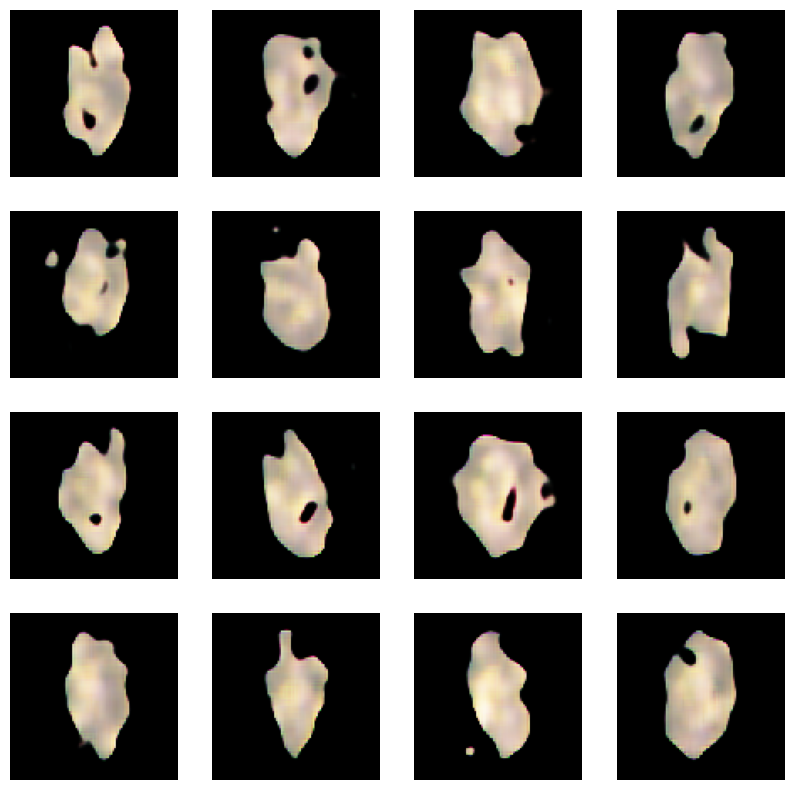

Epoch 80/200 | Generator Loss: 0.8195 | Discriminator Loss: 1.2257 | Time: 8.71s
Epoch 81/200 | Generator Loss: 0.9271 | Discriminator Loss: 1.1537 | Time: 8.18s
Epoch 82/200 | Generator Loss: 0.9245 | Discriminator Loss: 1.2633 | Time: 8.19s
Epoch 83/200 | Generator Loss: 0.8668 | Discriminator Loss: 1.1801 | Time: 8.20s
Epoch 84/200 | Generator Loss: 0.8608 | Discriminator Loss: 1.1448 | Time: 8.21s
Epoch 85/200 | Generator Loss: 0.9128 | Discriminator Loss: 1.2825 | Time: 8.21s
Epoch 86/200 | Generator Loss: 0.8569 | Discriminator Loss: 1.1789 | Time: 8.20s
Epoch 87/200 | Generator Loss: 0.8428 | Discriminator Loss: 1.1635 | Time: 8.20s
Epoch 88/200 | Generator Loss: 0.8636 | Discriminator Loss: 1.2346 | Time: 8.23s
Epoch 89/200 | Generator Loss: 0.8605 | Discriminator Loss: 1.1850 | Time: 8.20s


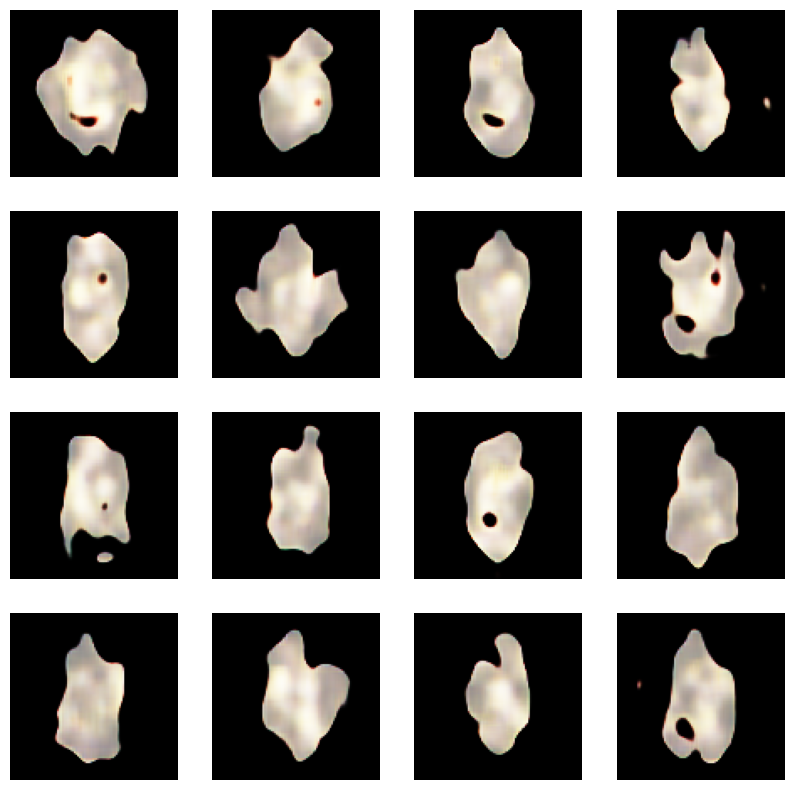

Epoch 90/200 | Generator Loss: 0.8148 | Discriminator Loss: 1.2135 | Time: 8.72s
Epoch 91/200 | Generator Loss: 0.8584 | Discriminator Loss: 1.3404 | Time: 8.17s
Epoch 92/200 | Generator Loss: 0.8091 | Discriminator Loss: 1.3159 | Time: 8.18s
Epoch 93/200 | Generator Loss: 0.7559 | Discriminator Loss: 1.3224 | Time: 8.14s
Epoch 94/200 | Generator Loss: 0.7495 | Discriminator Loss: 1.3910 | Time: 8.16s
Epoch 95/200 | Generator Loss: 0.7865 | Discriminator Loss: 1.3411 | Time: 8.16s
Epoch 96/200 | Generator Loss: 0.7457 | Discriminator Loss: 1.3414 | Time: 8.15s
Epoch 97/200 | Generator Loss: 0.7812 | Discriminator Loss: 1.3403 | Time: 8.15s
Epoch 98/200 | Generator Loss: 0.8356 | Discriminator Loss: 1.2463 | Time: 8.13s
Epoch 99/200 | Generator Loss: 0.8140 | Discriminator Loss: 1.2208 | Time: 8.12s


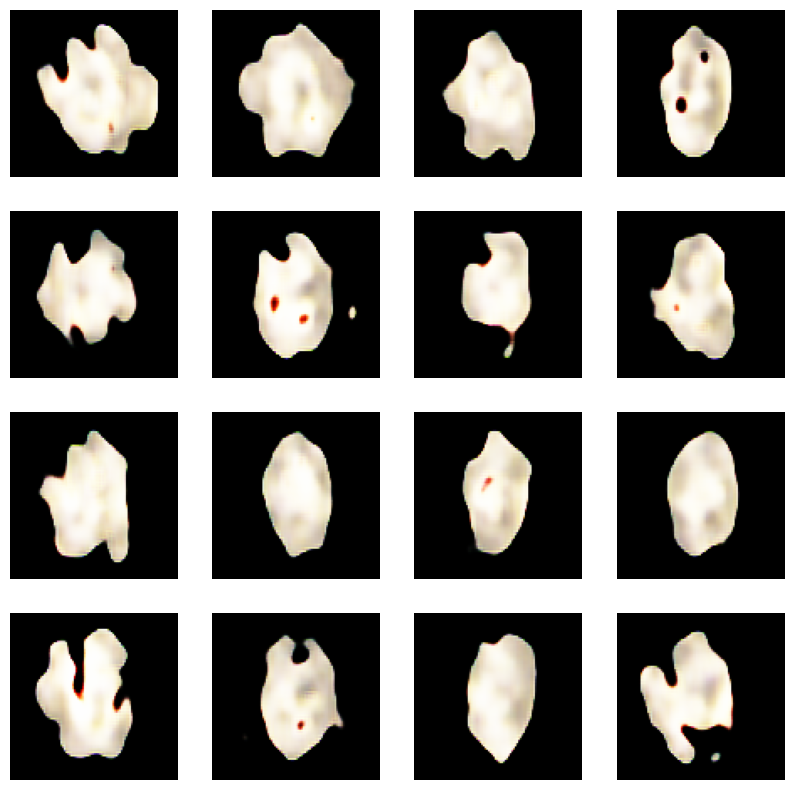

Epoch 100/200 | Generator Loss: 0.8226 | Discriminator Loss: 1.2634 | Time: 8.64s
Epoch 101/200 | Generator Loss: 0.8674 | Discriminator Loss: 1.2028 | Time: 8.10s
Epoch 102/200 | Generator Loss: 0.8152 | Discriminator Loss: 1.1832 | Time: 8.11s
Epoch 103/200 | Generator Loss: 0.8779 | Discriminator Loss: 1.3376 | Time: 8.09s
Epoch 104/200 | Generator Loss: 0.8481 | Discriminator Loss: 1.2091 | Time: 8.09s
Epoch 105/200 | Generator Loss: 0.8011 | Discriminator Loss: 1.2050 | Time: 8.08s
Epoch 106/200 | Generator Loss: 0.8318 | Discriminator Loss: 1.3082 | Time: 8.10s
Epoch 107/200 | Generator Loss: 0.8587 | Discriminator Loss: 1.1879 | Time: 8.12s
Epoch 108/200 | Generator Loss: 0.7893 | Discriminator Loss: 1.2391 | Time: 8.11s
Epoch 109/200 | Generator Loss: 0.8157 | Discriminator Loss: 1.2682 | Time: 8.13s


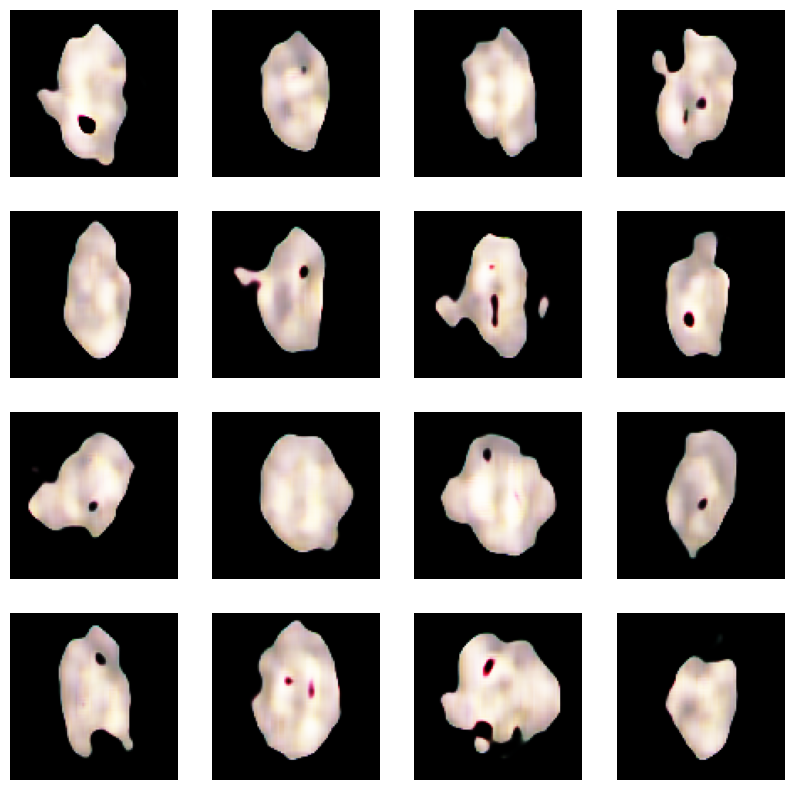

Epoch 110/200 | Generator Loss: 0.8873 | Discriminator Loss: 1.2140 | Time: 8.66s
Epoch 111/200 | Generator Loss: 0.7912 | Discriminator Loss: 1.2397 | Time: 8.10s
Epoch 112/200 | Generator Loss: 0.8720 | Discriminator Loss: 1.2943 | Time: 8.13s
Epoch 113/200 | Generator Loss: 0.8658 | Discriminator Loss: 1.2093 | Time: 8.15s
Epoch 114/200 | Generator Loss: 0.7729 | Discriminator Loss: 1.2792 | Time: 8.13s
Epoch 115/200 | Generator Loss: 0.8323 | Discriminator Loss: 1.2474 | Time: 8.16s
Epoch 116/200 | Generator Loss: 0.8463 | Discriminator Loss: 1.2659 | Time: 8.20s
Epoch 117/200 | Generator Loss: 0.7981 | Discriminator Loss: 1.2572 | Time: 8.16s
Epoch 118/200 | Generator Loss: 0.8019 | Discriminator Loss: 1.2269 | Time: 8.16s
Epoch 119/200 | Generator Loss: 0.8422 | Discriminator Loss: 1.2788 | Time: 8.21s


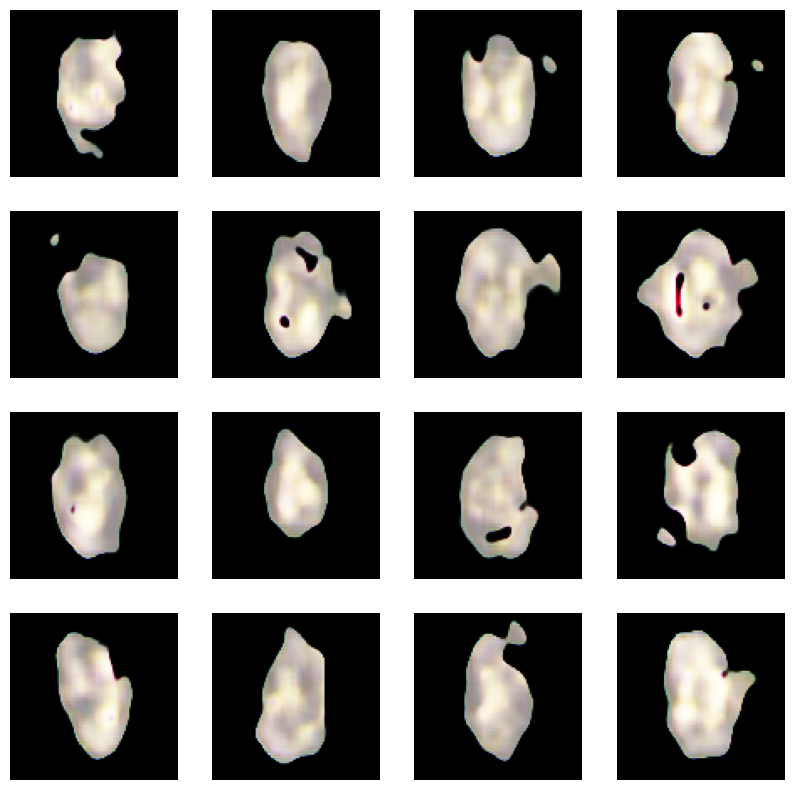

Epoch 120/200 | Generator Loss: 0.8186 | Discriminator Loss: 1.2387 | Time: 9.15s
Epoch 121/200 | Generator Loss: 0.8203 | Discriminator Loss: 1.2363 | Time: 8.13s
Epoch 122/200 | Generator Loss: 0.8320 | Discriminator Loss: 1.2355 | Time: 8.14s
Epoch 123/200 | Generator Loss: 0.8333 | Discriminator Loss: 1.2203 | Time: 8.16s
Epoch 124/200 | Generator Loss: 0.8290 | Discriminator Loss: 1.2285 | Time: 8.16s
Epoch 125/200 | Generator Loss: 0.8598 | Discriminator Loss: 1.2651 | Time: 8.19s
Epoch 126/200 | Generator Loss: 0.8490 | Discriminator Loss: 1.2291 | Time: 8.17s
Epoch 127/200 | Generator Loss: 0.8307 | Discriminator Loss: 1.1894 | Time: 8.19s
Epoch 128/200 | Generator Loss: 0.8842 | Discriminator Loss: 1.2191 | Time: 8.19s
Epoch 129/200 | Generator Loss: 0.8331 | Discriminator Loss: 1.2306 | Time: 8.18s


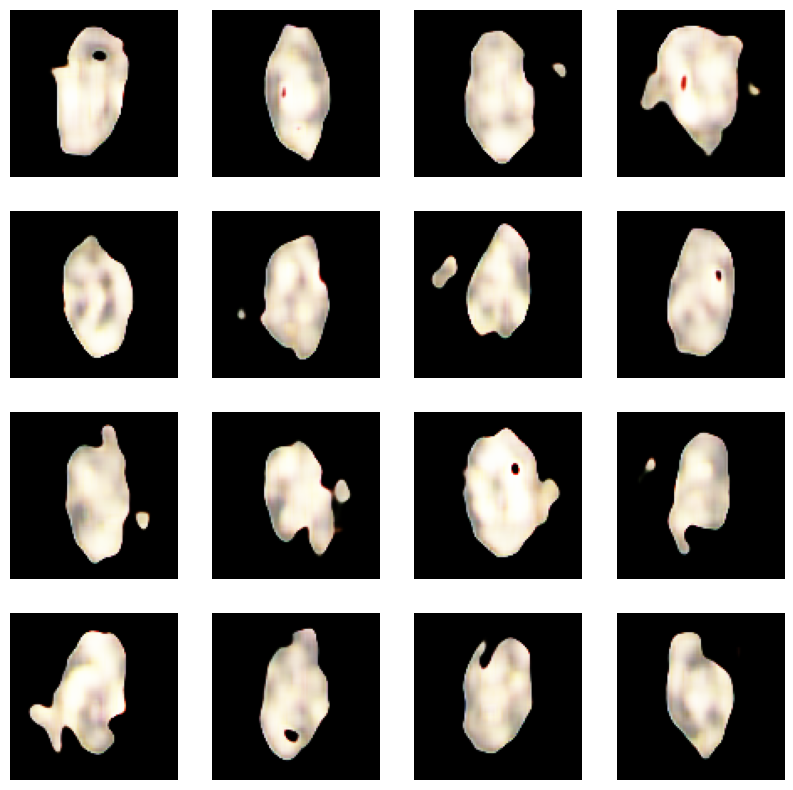

Epoch 130/200 | Generator Loss: 0.8571 | Discriminator Loss: 1.2138 | Time: 8.67s
Epoch 131/200 | Generator Loss: 0.8720 | Discriminator Loss: 1.2186 | Time: 8.18s
Epoch 132/200 | Generator Loss: 0.8367 | Discriminator Loss: 1.2090 | Time: 8.16s
Epoch 133/200 | Generator Loss: 0.8515 | Discriminator Loss: 1.2182 | Time: 8.16s
Epoch 134/200 | Generator Loss: 0.8494 | Discriminator Loss: 1.2364 | Time: 8.13s
Epoch 135/200 | Generator Loss: 0.8693 | Discriminator Loss: 1.2246 | Time: 8.14s
Epoch 136/200 | Generator Loss: 0.8405 | Discriminator Loss: 1.2064 | Time: 8.10s
Epoch 137/200 | Generator Loss: 0.8734 | Discriminator Loss: 1.2382 | Time: 8.10s
Epoch 138/200 | Generator Loss: 0.8511 | Discriminator Loss: 1.1897 | Time: 8.09s
Epoch 139/200 | Generator Loss: 0.8679 | Discriminator Loss: 1.2073 | Time: 8.09s


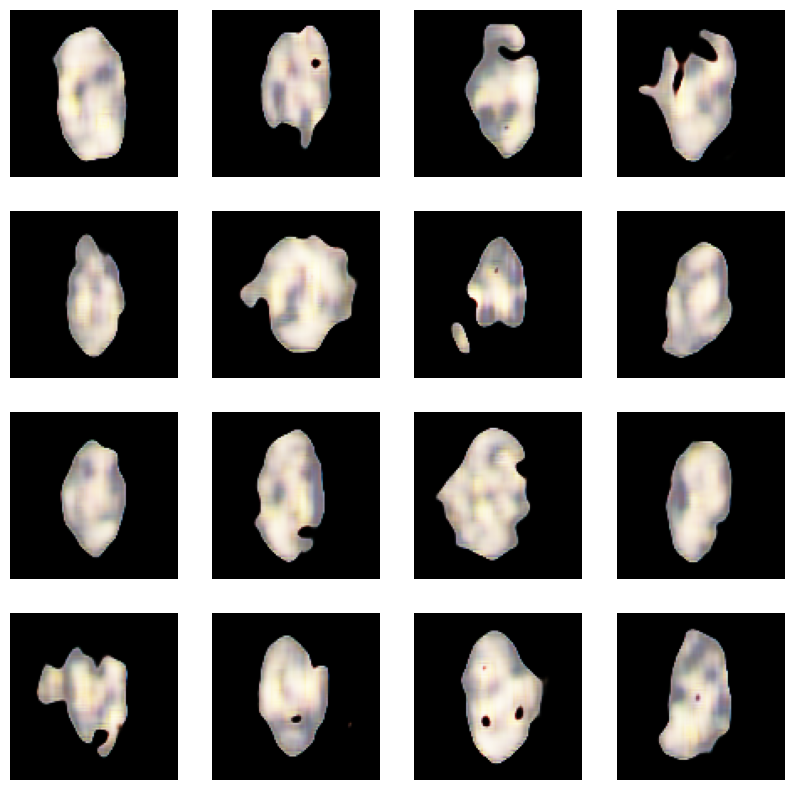

Epoch 140/200 | Generator Loss: 0.8615 | Discriminator Loss: 1.2138 | Time: 8.57s
Epoch 142/200 | Generator Loss: 0.8523 | Discriminator Loss: 1.1886 | Time: 8.07s
Epoch 143/200 | Generator Loss: 0.8863 | Discriminator Loss: 1.2015 | Time: 8.08s
Epoch 144/200 | Generator Loss: 0.8914 | Discriminator Loss: 1.2103 | Time: 8.07s
Epoch 145/200 | Generator Loss: 0.8513 | Discriminator Loss: 1.1747 | Time: 8.08s
Epoch 146/200 | Generator Loss: 0.8824 | Discriminator Loss: 1.1834 | Time: 8.08s
Epoch 147/200 | Generator Loss: 0.8949 | Discriminator Loss: 1.1708 | Time: 8.10s
Epoch 148/200 | Generator Loss: 0.8844 | Discriminator Loss: 1.1634 | Time: 8.11s
Epoch 149/200 | Generator Loss: 0.8950 | Discriminator Loss: 1.1701 | Time: 8.11s


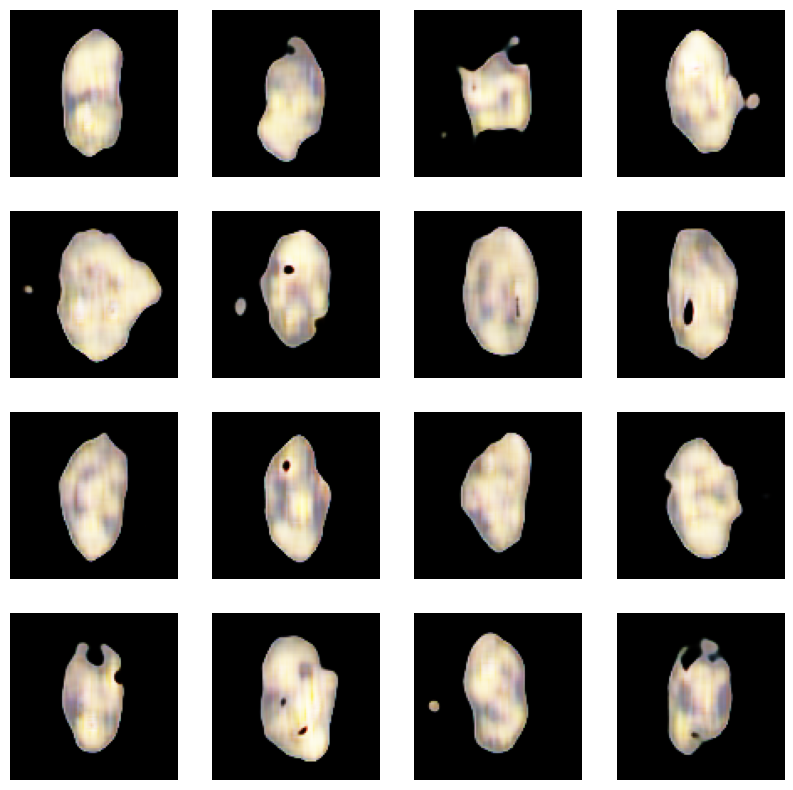

Epoch 150/200 | Generator Loss: 0.8776 | Discriminator Loss: 1.1926 | Time: 8.61s
Epoch 151/200 | Generator Loss: 0.8922 | Discriminator Loss: 1.2228 | Time: 8.13s
Epoch 152/200 | Generator Loss: 0.8351 | Discriminator Loss: 1.2128 | Time: 8.14s
Epoch 153/200 | Generator Loss: 0.8655 | Discriminator Loss: 1.2215 | Time: 8.16s
Epoch 154/200 | Generator Loss: 0.8642 | Discriminator Loss: 1.1846 | Time: 8.15s
Epoch 155/200 | Generator Loss: 0.9231 | Discriminator Loss: 1.2130 | Time: 8.17s
Epoch 156/200 | Generator Loss: 0.8819 | Discriminator Loss: 1.1625 | Time: 8.16s
Epoch 157/200 | Generator Loss: 0.9001 | Discriminator Loss: 1.2433 | Time: 8.19s
Epoch 158/200 | Generator Loss: 0.8337 | Discriminator Loss: 1.2183 | Time: 8.17s
Epoch 159/200 | Generator Loss: 0.8469 | Discriminator Loss: 1.2294 | Time: 8.15s


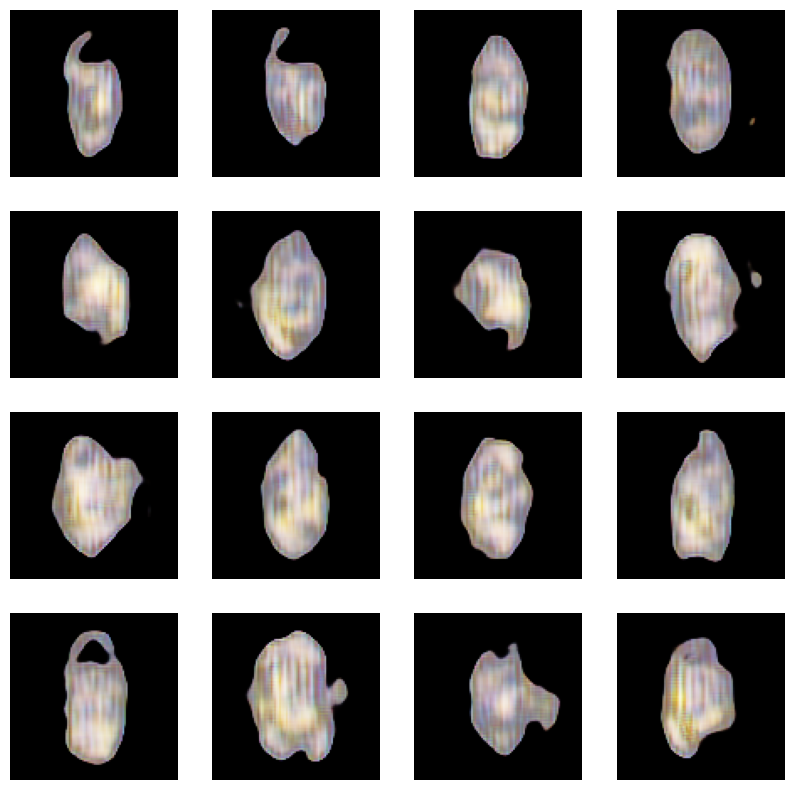

Epoch 160/200 | Generator Loss: 0.8611 | Discriminator Loss: 1.2358 | Time: 8.65s
Epoch 161/200 | Generator Loss: 0.8748 | Discriminator Loss: 1.1975 | Time: 8.11s
Epoch 162/200 | Generator Loss: 0.9072 | Discriminator Loss: 1.1423 | Time: 8.11s
Epoch 163/200 | Generator Loss: 0.9202 | Discriminator Loss: 1.1522 | Time: 8.11s
Epoch 164/200 | Generator Loss: 0.9699 | Discriminator Loss: 1.1038 | Time: 8.09s
Epoch 165/200 | Generator Loss: 0.8659 | Discriminator Loss: 1.1755 | Time: 8.08s
Epoch 166/200 | Generator Loss: 0.9251 | Discriminator Loss: 1.2146 | Time: 8.10s
Epoch 167/200 | Generator Loss: 0.8527 | Discriminator Loss: 1.1912 | Time: 8.08s
Epoch 168/200 | Generator Loss: 0.9187 | Discriminator Loss: 1.2094 | Time: 8.08s
Epoch 169/200 | Generator Loss: 0.8715 | Discriminator Loss: 1.1788 | Time: 8.07s


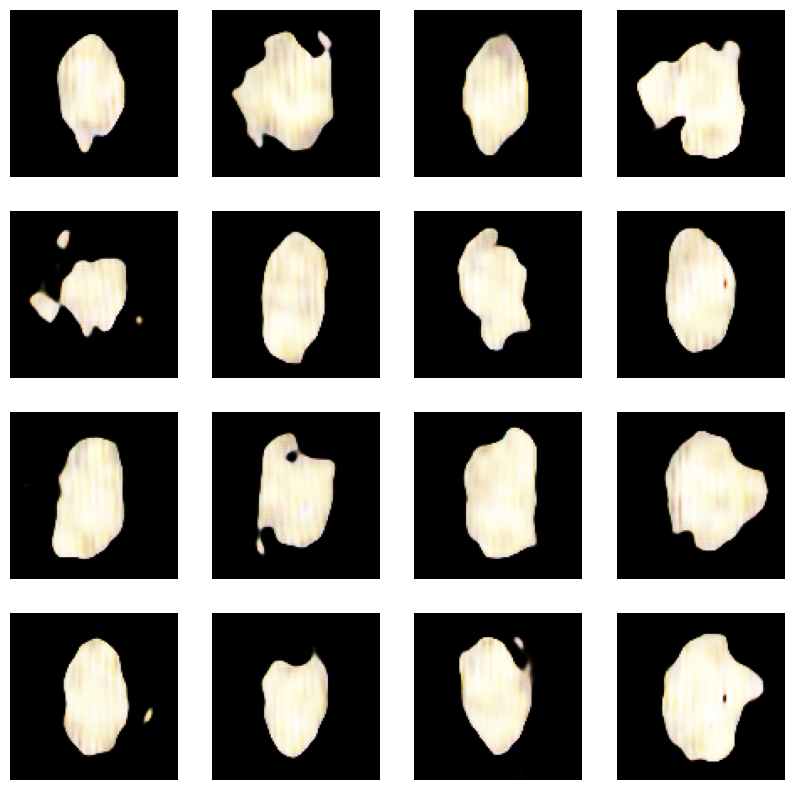

Epoch 170/200 | Generator Loss: 0.9622 | Discriminator Loss: 1.1583 | Time: 8.56s
Epoch 171/200 | Generator Loss: 0.9783 | Discriminator Loss: 1.1475 | Time: 8.04s
Epoch 172/200 | Generator Loss: 0.9044 | Discriminator Loss: 1.1005 | Time: 8.07s
Epoch 173/200 | Generator Loss: 0.9220 | Discriminator Loss: 1.1497 | Time: 8.07s
Epoch 174/200 | Generator Loss: 0.9795 | Discriminator Loss: 1.1169 | Time: 8.09s
Epoch 175/200 | Generator Loss: 0.9407 | Discriminator Loss: 1.0925 | Time: 8.10s
Epoch 176/200 | Generator Loss: 0.9441 | Discriminator Loss: 1.1584 | Time: 8.10s
Epoch 177/200 | Generator Loss: 1.0113 | Discriminator Loss: 1.1177 | Time: 8.14s
Epoch 178/200 | Generator Loss: 0.9498 | Discriminator Loss: 1.0875 | Time: 8.15s
Epoch 179/200 | Generator Loss: 0.9547 | Discriminator Loss: 1.2020 | Time: 8.18s


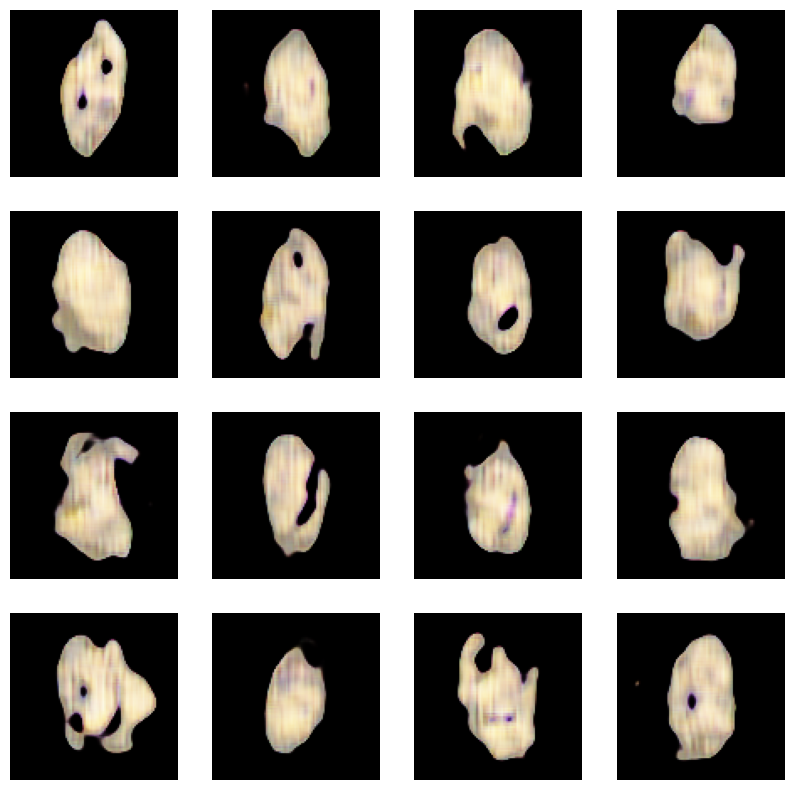

Epoch 180/200 | Generator Loss: 0.9538 | Discriminator Loss: 1.1166 | Time: 8.64s
Epoch 181/200 | Generator Loss: 0.9338 | Discriminator Loss: 1.1011 | Time: 8.13s
Epoch 182/200 | Generator Loss: 0.9670 | Discriminator Loss: 1.1736 | Time: 8.17s
Epoch 183/200 | Generator Loss: 0.9337 | Discriminator Loss: 1.1249 | Time: 8.17s
Epoch 184/200 | Generator Loss: 0.9406 | Discriminator Loss: 1.1188 | Time: 8.19s
Epoch 185/200 | Generator Loss: 0.9915 | Discriminator Loss: 1.0873 | Time: 8.17s
Epoch 186/200 | Generator Loss: 0.9481 | Discriminator Loss: 1.0971 | Time: 8.14s
Epoch 187/200 | Generator Loss: 0.9962 | Discriminator Loss: 1.1322 | Time: 8.13s
Epoch 188/200 | Generator Loss: 0.9664 | Discriminator Loss: 1.0872 | Time: 8.12s
Epoch 189/200 | Generator Loss: 0.9480 | Discriminator Loss: 1.0789 | Time: 8.09s


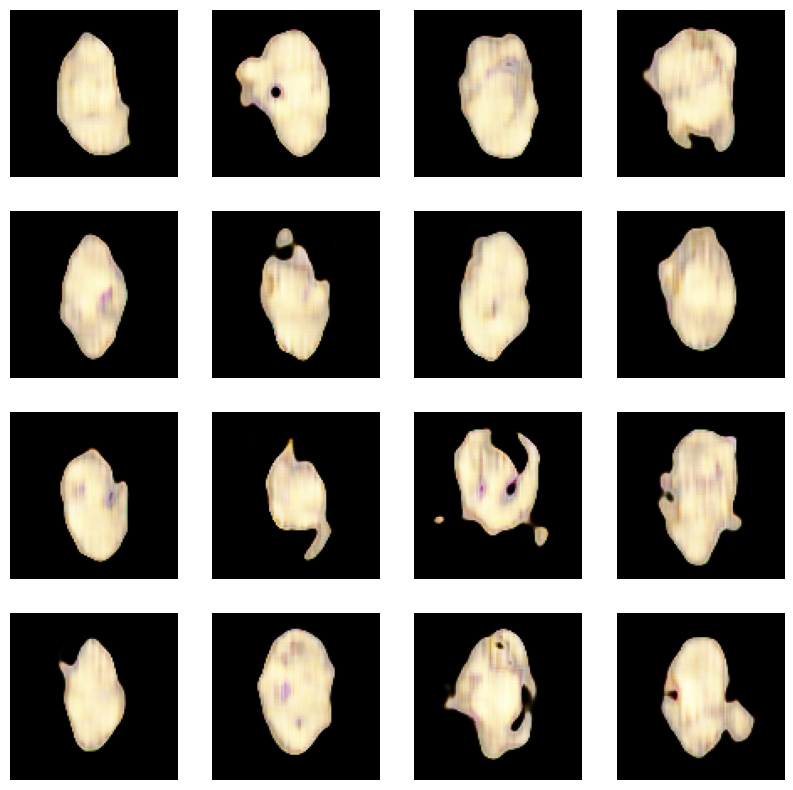

Epoch 190/200 | Generator Loss: 0.9730 | Discriminator Loss: 1.0967 | Time: 8.60s
Epoch 191/200 | Generator Loss: 0.9597 | Discriminator Loss: 1.1421 | Time: 8.05s
Epoch 192/200 | Generator Loss: 0.9314 | Discriminator Loss: 1.0965 | Time: 8.05s
Epoch 193/200 | Generator Loss: 0.9619 | Discriminator Loss: 1.1166 | Time: 8.06s
Epoch 194/200 | Generator Loss: 0.9643 | Discriminator Loss: 1.1037 | Time: 8.05s
Epoch 195/200 | Generator Loss: 0.9575 | Discriminator Loss: 1.1103 | Time: 8.06s
Epoch 196/200 | Generator Loss: 1.0087 | Discriminator Loss: 1.0974 | Time: 8.04s
Epoch 197/200 | Generator Loss: 0.9793 | Discriminator Loss: 1.1387 | Time: 8.06s
Epoch 198/200 | Generator Loss: 0.9428 | Discriminator Loss: 1.0767 | Time: 8.03s
Epoch 199/200 | Generator Loss: 0.9738 | Discriminator Loss: 1.0914 | Time: 8.05s


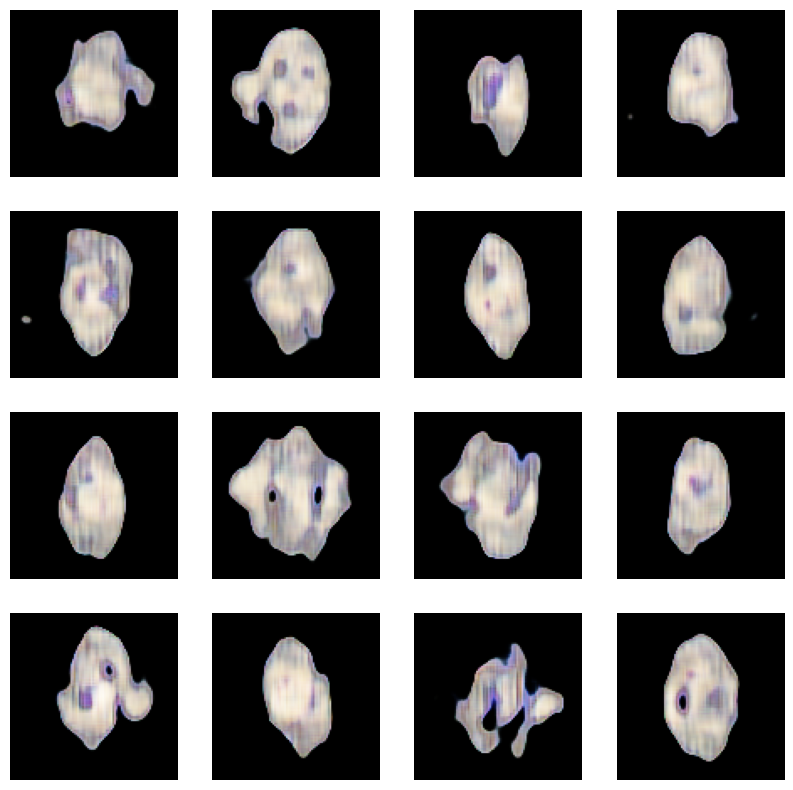

Epoch 200/200 | Generator Loss: 0.9519 | Discriminator Loss: 1.1524 | Time: 9.08s


In [34]:
EPOCHS= 200

gen_losses, disc_losses= m_train(EPOCHS, dataset)

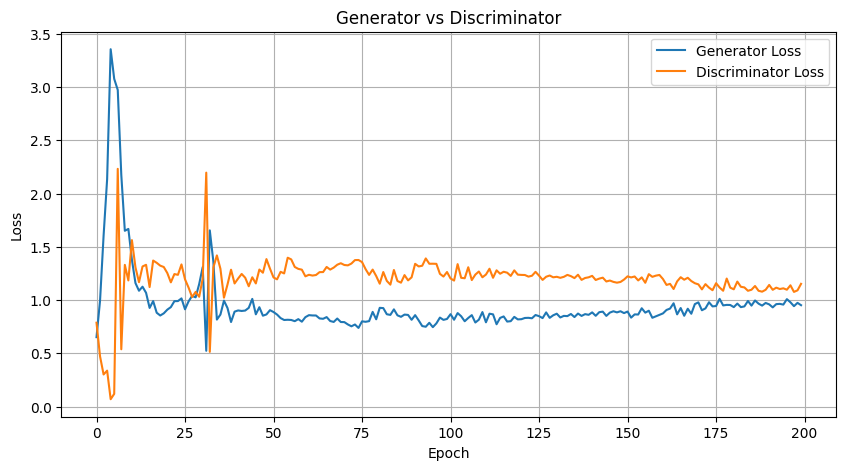

In [35]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.title('Generator vs Discriminator') 
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Evaluation

In [47]:
import tensorflow as tf
import numpy as np
import cv2
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm

def calculate_fid(real_images, generated_images, batch_size=8):
    # Resize images to InceptionV3 input size (299x299)
    real_resized = np.array([cv2.resize(img, (299, 299)) for img in real_images])
    fake_resized = np.array([cv2.resize(img, (299, 299)) for img in generated_images])

    real_resized = preprocess_input(real_resized.astype(np.float32))
    fake_resized = preprocess_input(fake_resized.astype(np.float32))

    inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

    act1 = inception_model.predict(real_resized, batch_size=batch_size, verbose=0)
    act2 = inception_model.predict(fake_resized, batch_size=batch_size, verbose=0)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)


    diff = mu1 - mu2
    covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
  
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = np.sum(diff**2) + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid


In [44]:
m_fake_images = generate_samples(m_generator, n_samples,  batch_size=8)
m_fid_score = calculate_fid(real_images, m_fake_images, batch_size=8)
print(f"Modified FID Score: {m_fid_score:.2f}")

Modified FID Score: 30.61


In [46]:
print("\n==== FID Comparison Results ====")
print(f"Baseline FID (Initial Model): {fid_score:.2f}")
print(f"Modified FID (After Improvements): {m_fid_score:.2f}")
print(f"Observed Improvement: {fid_score - m_fid_score:.2f} points (Improvement Metric)")



==== FID Comparison Results ====
Baseline FID (Initial Model): 118.88
Modified FID (After Improvements): 30.61
Observed Improvement: 88.27 points (Improvement Metric)
